In [4]:
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import plotly.express as px
import os
from sklearn.metrics import confusion_matrix

In [5]:
path = './top_10.csv'
df = pd.read_csv(path)
df = df.fillna("None")
ids = [i for i in range(1, 31)]

df_sorted = df.sort_values(by=['Model', 'Augmentasi'], ascending=[True,False])

df_sorted['model_id'] = ids

df_sorted

,Model,Augmentasi,Freeze,Learning Rate,Layer,Optimizer,Result Train,Validation,Test,Test Loss,Time (min),Epoch,model_id
0,Inception,Yes,None,0.0001,1,Adam,0.9982,0.9961,1.0000,0.002035,38,14,1
2,Inception,Yes,None,0.0010,1,Adam,0.9956,1.0000,0.9960,0.007950,74,27,2
3,Inception,Yes,None,0.0010,2,Adam,0.9949,0.9942,0.9960,0.009453,52,19,3
4,Inception,Yes,None,0.0010,1,SGD,0.9990,0.9903,0.9921,0.026240,65,23,4
5,Inception,Yes,None,0.0010,2,SGD,0.9996,0.9961,0.9901,0.031170,79,31,5
1,Inception,No,None,0.0001,1,Adam,0.9991,0.9952,1.0000,0.004126,11,19,6
6,Inception,No,None,0.0010,1,SGD,0.9988,0.9952,0.9901,0.051310,28,50,7
7,Inception,No,None,0.0010,1,Adam,0.9882,0.9952,0.9901,0.047590,9,16,8
8,Inception,No,½,0.0010,2,Adam,0.9962,0.9903,0.9901,0.034430,5,17,9
9,Inception,No,None,0.0001,2,Adam,0.9941,1.0000,0.9901,0.035890,8,14,10


In [6]:
# Assuming your models are in the 'models' directory and have names like 'model6.h5', 'model1.h5', etc.
models_dir = '../models/top10/'

# Create an empty dictionary to store the loaded models
loaded_models = {}

for id in ids:
    model_path = os.path.join(models_dir, f'{id}.h5')
    if os.path.exists(model_path):
        loaded_models[id] = tf.keras.models.load_model(model_path)
        print(f'Loaded model {id}')
    else:
        print(f"No model found for id {id}")

Loaded model 1
Loaded model 2
Loaded model 3
Loaded model 4
Loaded model 5
Loaded model 6
Loaded model 7
Loaded model 8
Loaded model 9
Loaded model 10
Loaded model 11
Loaded model 12
Loaded model 13
Loaded model 14
Loaded model 15
Loaded model 16
Loaded model 17
Loaded model 18
Loaded model 19
Loaded model 20
Loaded model 21
Loaded model 22
Loaded model 23
Loaded model 24
Loaded model 25
Loaded model 26
Loaded model 27
Loaded model 28
Loaded model 29
Loaded model 30


# Functions

In [7]:
data_dir = '../dataset/realworld_test_data/processed/version1/'

IMAGE_SIZE = 300
class_names = sorted(os.listdir(data_dir))
n_classes = len(class_names)

print(f"Total number of classes in train: {n_classes}")
print(f"Classes: {class_names}")

Total number of classes in train: 20
Classes: ['ba', 'ca', 'da', 'dha', 'ga', 'ha', 'ja', 'ka', 'la', 'ma', 'na', 'nga', 'nya', 'pa', 'ra', 'sa', 'ta', 'tha', 'wa', 'ya']


In [8]:
def load_and_preprocess_image(image, label):
    # Resize the image to the desired size
    image = tf.image.resize(image, [IMAGE_SIZE, IMAGE_SIZE])
    
    # Rescale pixel values to be in the range [0, 1]
    image = tf.image.per_image_standardization(image)
    
#     # Convert image data type to tf.float32
#     image = tf.cast(image, tf.float32)
    
    return image, label

In [9]:
def plot_images(dataset: tf.data.Dataset, n_rows: int = 5, n_cols: int = 4, class_names=class_names, figsize=(20, 20), model=None, check=False, verbose=1):
    """
    Plots a grid of images and their corresponding labels from a tf.data.Dataset object.

    Args:
        dataset (tf.data.Dataset): A TensorFlow dataset object containing the images and labels to plot.
        n_rows (int): Number of rows in the plot grid. Default is 5.
        n_cols (int): Number of columns in the plot grid. Default is 4.
        class_names (list): A list of strings mapping the integer labels to their corresponding class names. Default is None.
        figsize (tuple): A tuple specifying the size of the figure. Default is (20, 20).
        model (tf.keras.Model): A trained TensorFlow model to make predictions on the images. Default is None.
        check (bool): If True and a model is provided, only incorrectly predicted images will be plotted. Default is False.
    """
    
    # Create a figure to display the images
    fig = plt.figure(figsize=figsize)
    
    # Initialize image counter
    image_count = 0
    
    # Loop over all batches in dataset
    for images, labels in dataset:
        
        # Loop over all images in batch
        for i in range(images.shape[0]):
            
            label = int(labels[i].numpy())
            title = "true: "+class_names[label]

            if model:
                pred = model.predict(images[i][np.newaxis], verbose=verbose)

                if check:
                    if label == np.argmax(pred):
                        continue

                pred_label = f"Pred: {np.argmax(pred)}"
                pred_percentage = f" ({np.max(pred) * 100:.2f}%)"
                if class_names:
                    pred_label += f" ({class_names[np.argmax(pred)]})"
                title += f"\n{pred_label} {pred_percentage}"

            # Create a subplot for each image
            ax = fig.add_subplot(n_rows, n_cols, image_count+1)    

            # Plot the image
            ax.imshow(images[i].numpy().astype("uint8"))

            # Set the title to the corresponding label
            ax.set_title(title)

            # Remove the axis ticks
            ax.set_xticks([])
            ax.set_yticks([])
            
            # Increment image counter
            image_count += 1
            
            # Check if maximum number of images has been reached
            if image_count >= n_rows * n_cols:
                break
        
        # Check if maximum number of images has been reached
        if image_count >= n_rows * n_cols:
            break
    
    # Show the plot
    plt.show()

In [10]:
def plot_confusion_m(y_true, y_pred, class_names=None, figsize=(15,15)):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=figsize)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

In [11]:
# Calculate class distribution
class_dis = [len(os.listdir(data_dir + name)) for name in class_names]
# class_dis = [len(os.listdir(val_dir + name)) for name in class_names]
# class_dis = [len(os.listdir(test_dir + name)) for name in class_names]

# Visualize using interactive pie chart
pie_chart = px.pie(values=class_dis, names=class_names, color=class_names)
pie_chart.update_layout({'title':{'text':"Class Distribution"}})
pie_chart.show()

# Visualize using interactive bar chart
bar_chart = px.bar(y=class_dis, x=class_names, color=class_names)
bar_chart.show()

In [12]:
real_test_ds = tf.keras.preprocessing.image_dataset_from_directory(data_dir)
real_test_ds_mapped = real_test_ds.map(load_and_preprocess_image)
real_test_ds_mapped.prefetch(tf.data.AUTOTUNE)

Found 200 files belonging to 20 classes.


<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 300, 300, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

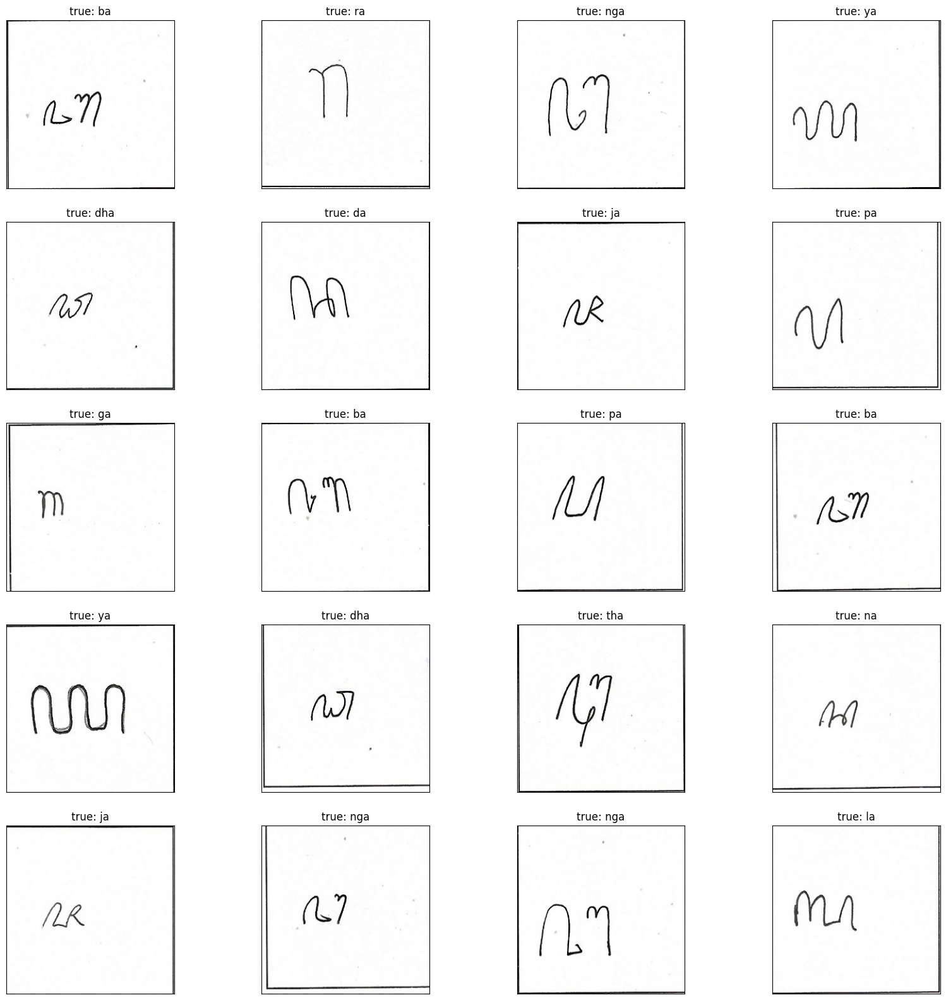

In [13]:
plot_images(real_test_ds)

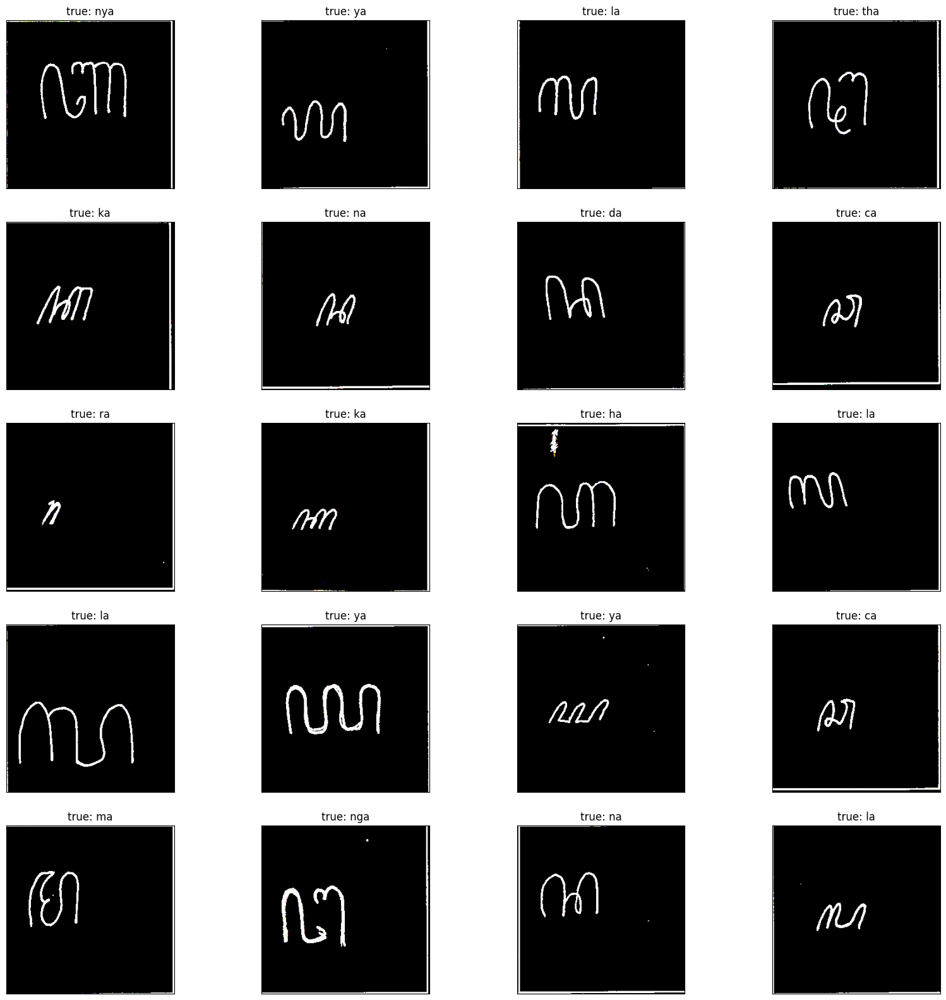

In [14]:
plot_images(real_test_ds_mapped)

START predicting with model 1 ...
==== CONFUSION MATRIX FOR MODEL 1 ====


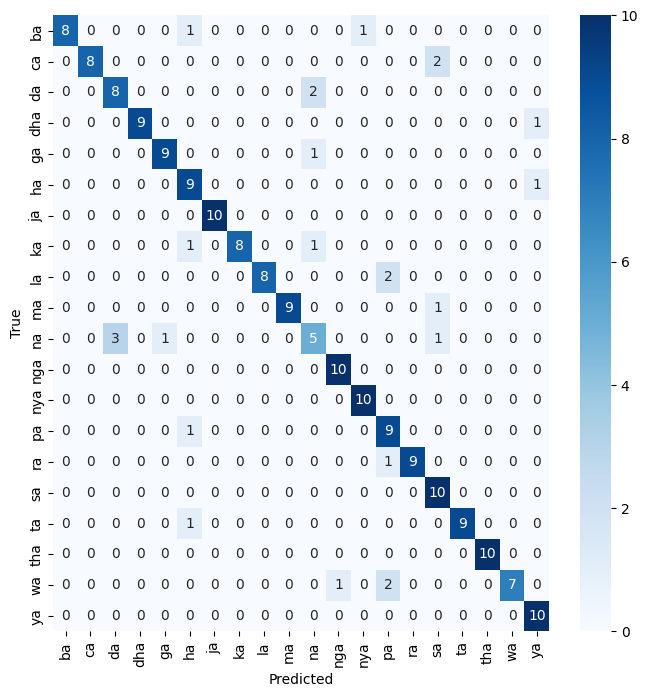

7/7 [==============================] - 13s 2s/step - loss: 0.5361 - accuracy: 0.8750
Loss    : 0.5361
Accuracy: 87.5%
FINISHED predicting with model 1 ... 

START predicting with model 2 ...
==== CONFUSION MATRIX FOR MODEL 2 ====


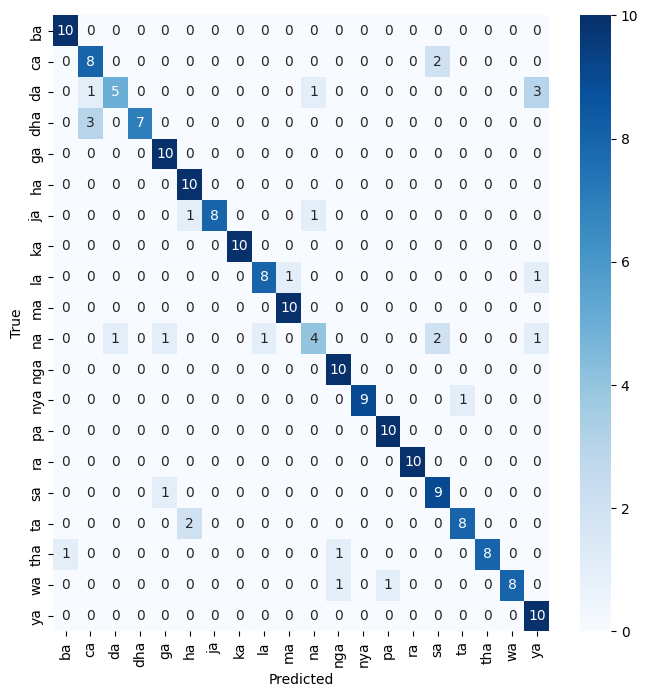

7/7 [==============================] - 13s 2s/step - loss: 0.8271 - accuracy: 0.8600
Loss    : 0.8271
Accuracy: 86.0%
FINISHED predicting with model 2 ... 

START predicting with model 3 ...
==== CONFUSION MATRIX FOR MODEL 3 ====


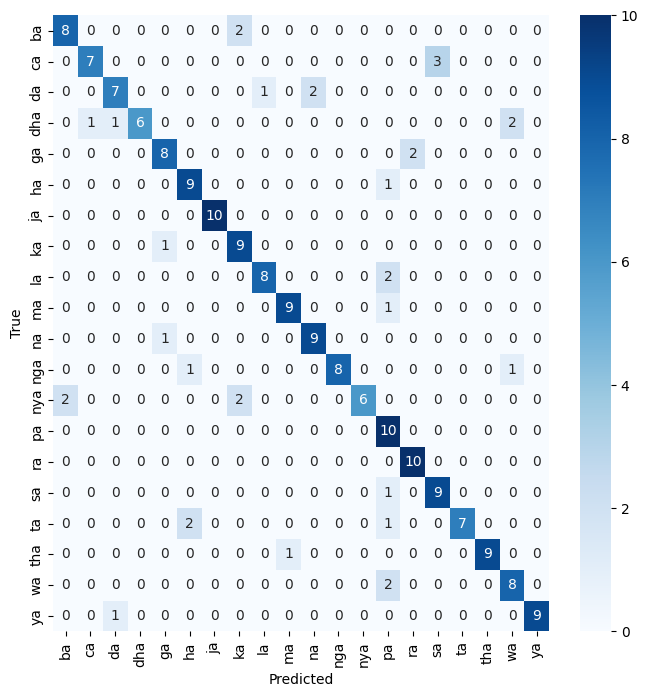

7/7 [==============================] - 15s 2s/step - loss: 0.7798 - accuracy: 0.8300
Loss    : 0.7798
Accuracy: 83.0%
FINISHED predicting with model 3 ... 

START predicting with model 4 ...
==== CONFUSION MATRIX FOR MODEL 4 ====


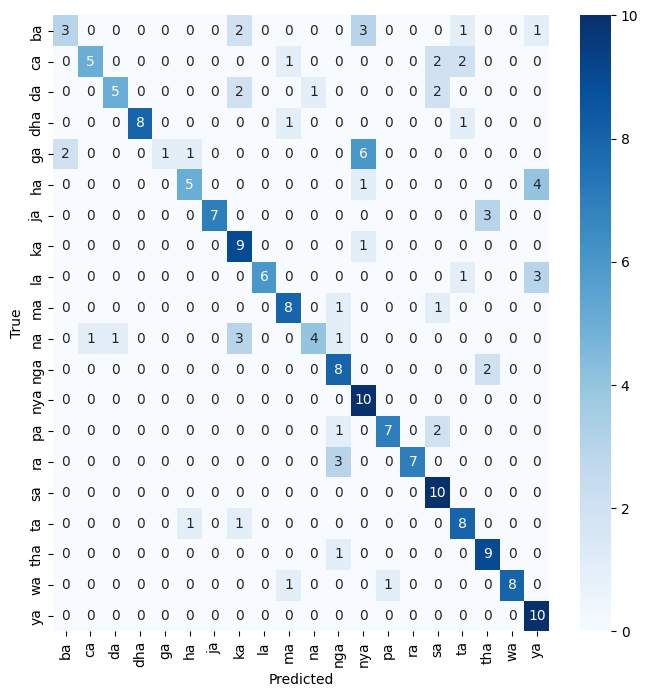

7/7 [==============================] - 13s 2s/step - loss: 0.9616 - accuracy: 0.6900
Loss    : 0.9616
Accuracy: 69.0%
FINISHED predicting with model 4 ... 

START predicting with model 5 ...
==== CONFUSION MATRIX FOR MODEL 5 ====


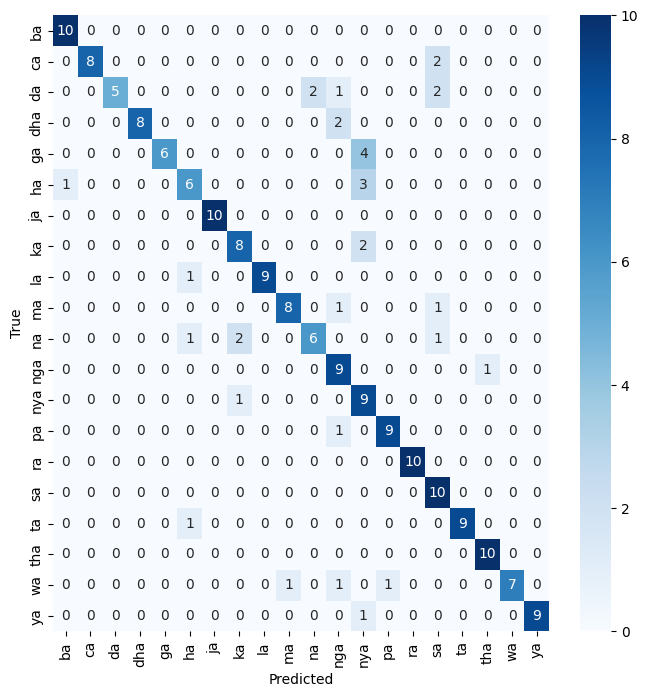

7/7 [==============================] - 13s 2s/step - loss: 0.7436 - accuracy: 0.8300
Loss    : 0.7436
Accuracy: 83.0%
FINISHED predicting with model 5 ... 

START predicting with model 6 ...
==== CONFUSION MATRIX FOR MODEL 6 ====


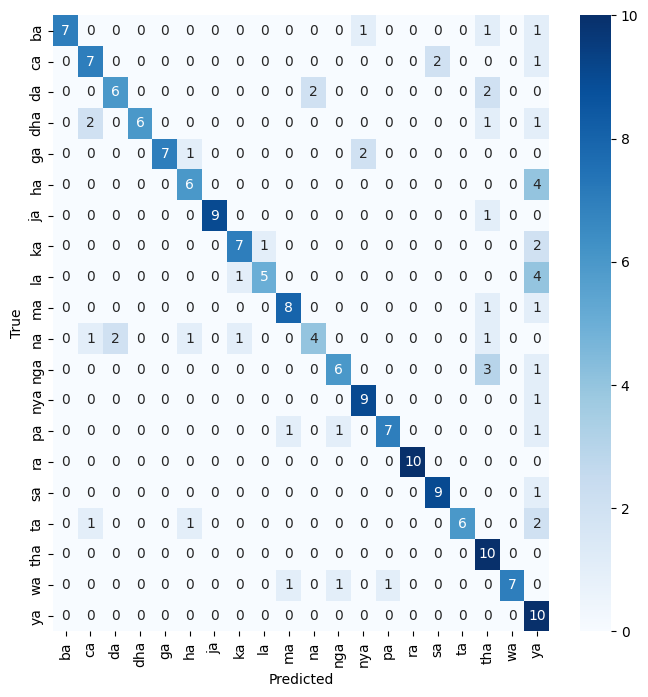

7/7 [==============================] - 14s 2s/step - loss: 0.9502 - accuracy: 0.7300
Loss    : 0.9502
Accuracy: 73.0%
FINISHED predicting with model 6 ... 

START predicting with model 7 ...
==== CONFUSION MATRIX FOR MODEL 7 ====


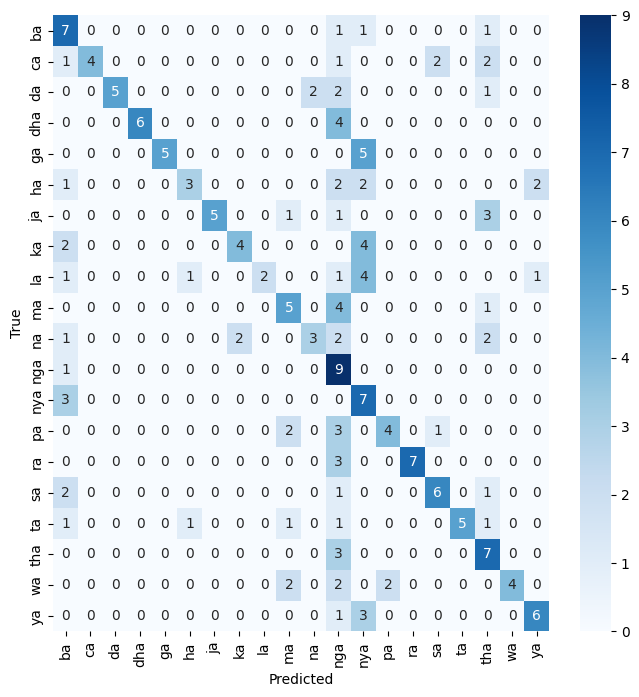

7/7 [==============================] - 16s 2s/step - loss: 1.7891 - accuracy: 0.5200
Loss    : 1.789
Accuracy: 52.0%
FINISHED predicting with model 7 ... 

START predicting with model 8 ...
==== CONFUSION MATRIX FOR MODEL 8 ====


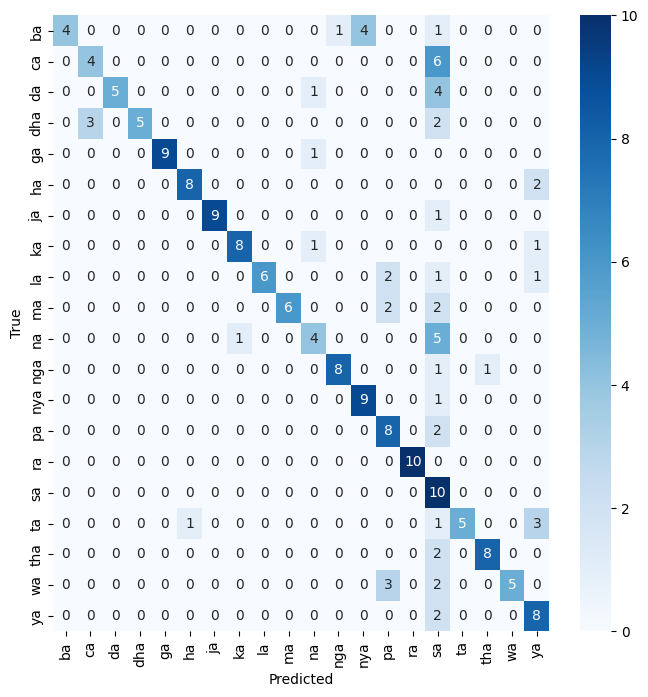

7/7 [==============================] - 14s 2s/step - loss: 1.2941 - accuracy: 0.6950
Loss    : 1.294
Accuracy: 69.5%
FINISHED predicting with model 8 ... 

START predicting with model 9 ...
==== CONFUSION MATRIX FOR MODEL 9 ====


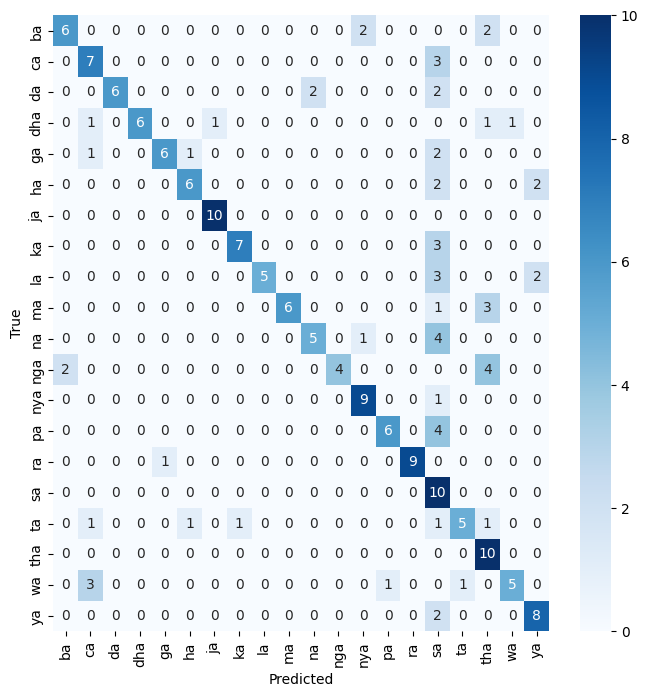

7/7 [==============================] - 14s 2s/step - loss: 1.3930 - accuracy: 0.6800
Loss    : 1.393
Accuracy: 68.0%
FINISHED predicting with model 9 ... 

START predicting with model 10 ...
==== CONFUSION MATRIX FOR MODEL 10 ====


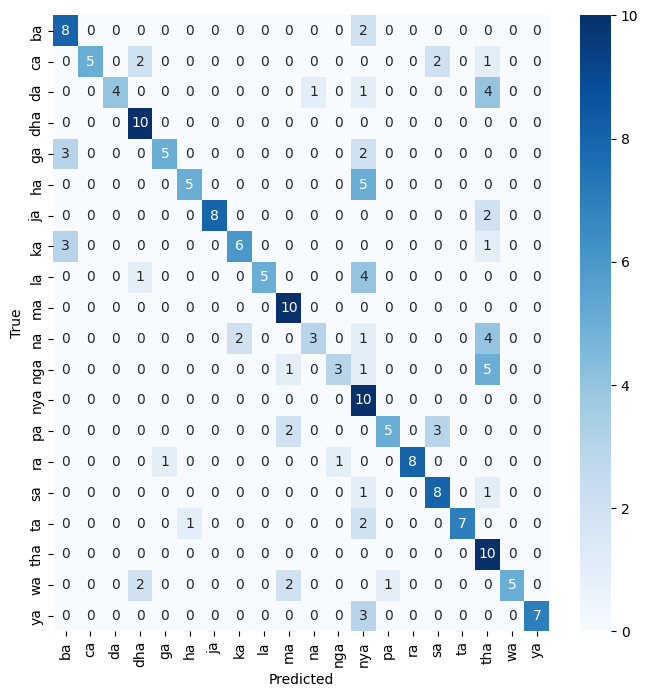

7/7 [==============================] - 17s 2s/step - loss: 1.4807 - accuracy: 0.6600
Loss    : 1.481
Accuracy: 66.0%
FINISHED predicting with model 10 ... 

START predicting with model 11 ...
==== CONFUSION MATRIX FOR MODEL 11 ====


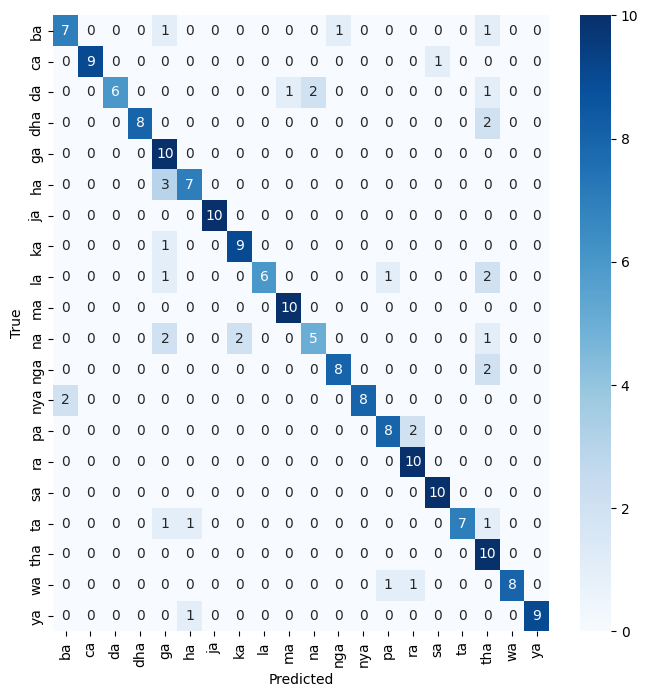

7/7 [==============================] - 50s 6s/step - loss: 0.6761 - accuracy: 0.8250
Loss    : 0.6761
Accuracy: 82.5%
FINISHED predicting with model 11 ... 

START predicting with model 12 ...
==== CONFUSION MATRIX FOR MODEL 12 ====


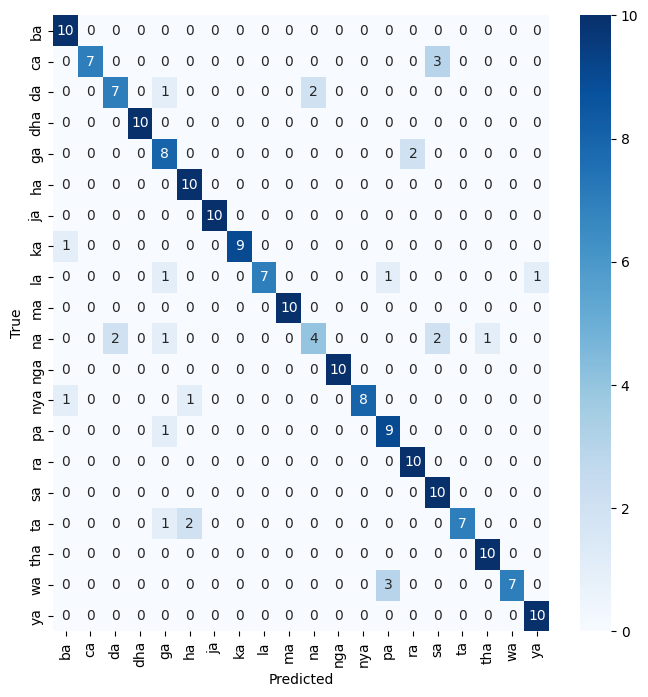

7/7 [==============================] - 44s 6s/step - loss: 0.5156 - accuracy: 0.8650
Loss    : 0.5156
Accuracy: 86.5%
FINISHED predicting with model 12 ... 

START predicting with model 13 ...
==== CONFUSION MATRIX FOR MODEL 13 ====


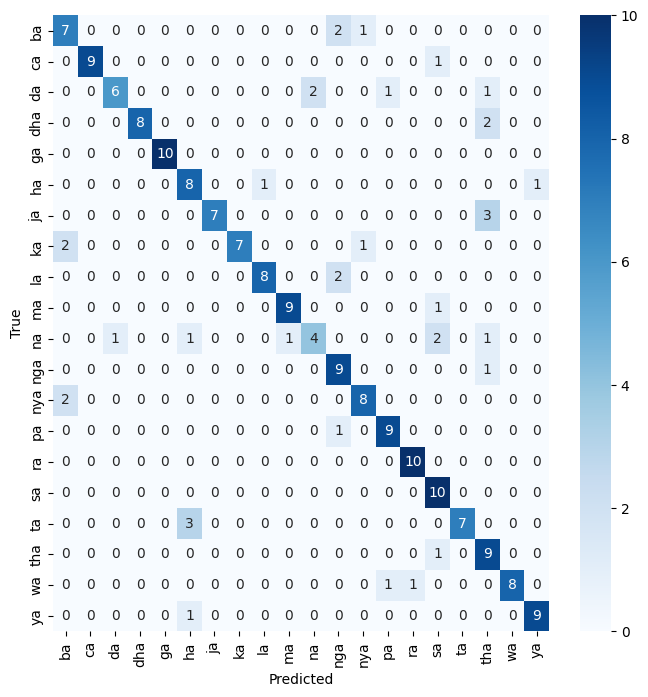

7/7 [==============================] - 50s 6s/step - loss: 0.7298 - accuracy: 0.8100
Loss    : 0.7298
Accuracy: 81.0%
FINISHED predicting with model 13 ... 

START predicting with model 14 ...
==== CONFUSION MATRIX FOR MODEL 14 ====


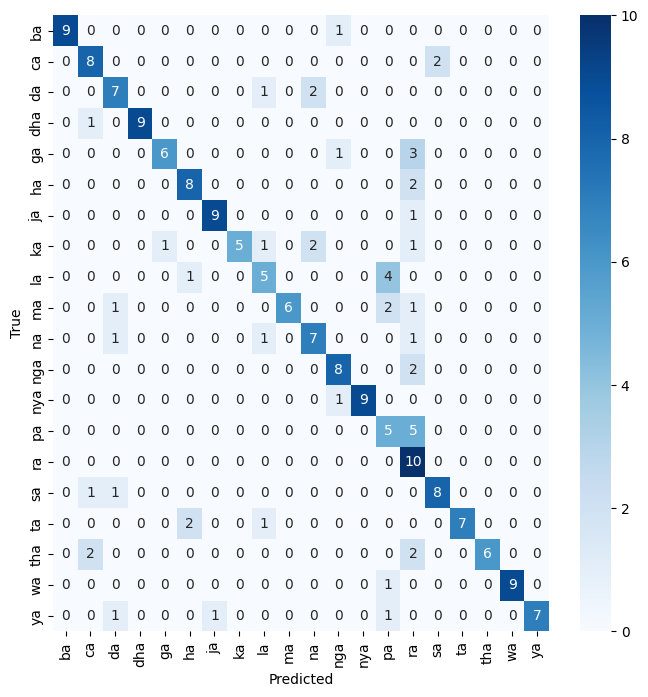

7/7 [==============================] - 45s 6s/step - loss: 1.0397 - accuracy: 0.7400
Loss    : 1.04
Accuracy: 74.0%
FINISHED predicting with model 14 ... 

START predicting with model 15 ...
==== CONFUSION MATRIX FOR MODEL 15 ====


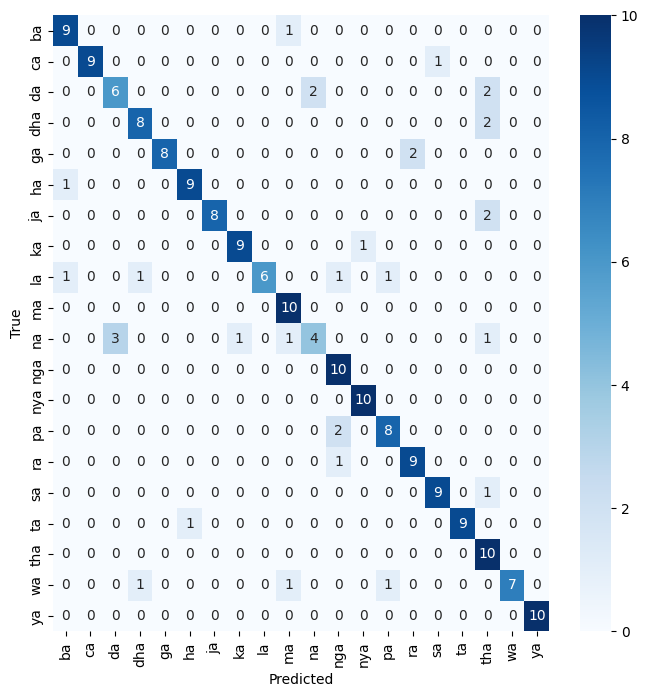

7/7 [==============================] - 48s 6s/step - loss: 0.4858 - accuracy: 0.8400
Loss    : 0.4858
Accuracy: 84.0%
FINISHED predicting with model 15 ... 

START predicting with model 16 ...
==== CONFUSION MATRIX FOR MODEL 16 ====


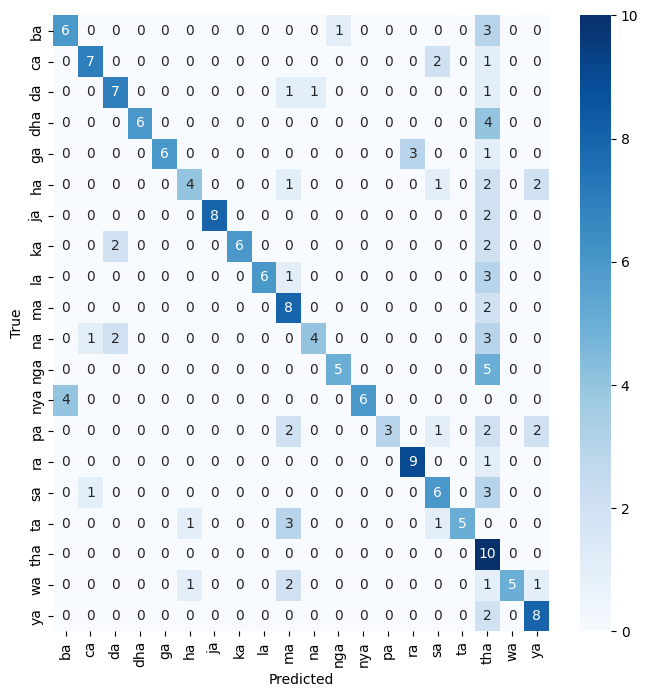

7/7 [==============================] - 43s 6s/step - loss: 1.7162 - accuracy: 0.6250
Loss    : 1.716
Accuracy: 62.5%
FINISHED predicting with model 16 ... 

START predicting with model 17 ...
==== CONFUSION MATRIX FOR MODEL 17 ====


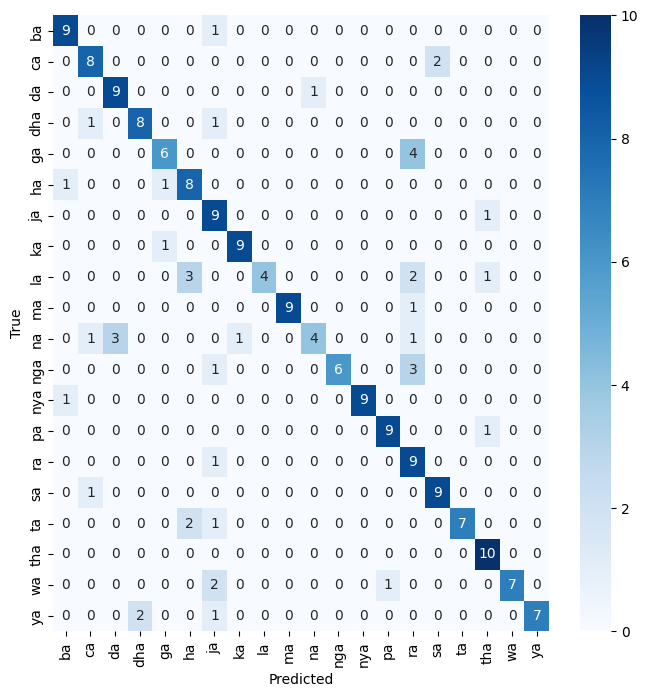

7/7 [==============================] - 44s 6s/step - loss: 1.3190 - accuracy: 0.7800
Loss    : 1.319
Accuracy: 78.0%
FINISHED predicting with model 17 ... 

START predicting with model 18 ...
==== CONFUSION MATRIX FOR MODEL 18 ====


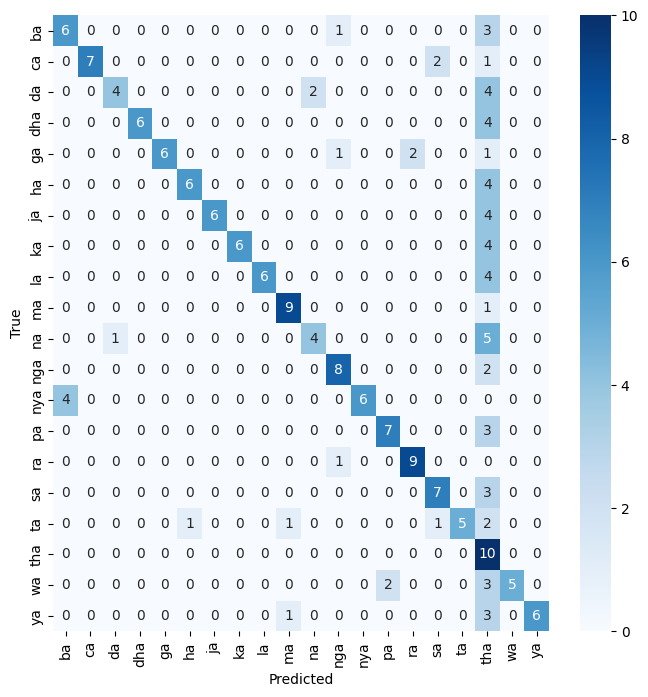

7/7 [==============================] - 43s 6s/step - loss: 1.7191 - accuracy: 0.6450
Loss    : 1.719
Accuracy: 64.5%
FINISHED predicting with model 18 ... 

START predicting with model 19 ...
==== CONFUSION MATRIX FOR MODEL 19 ====


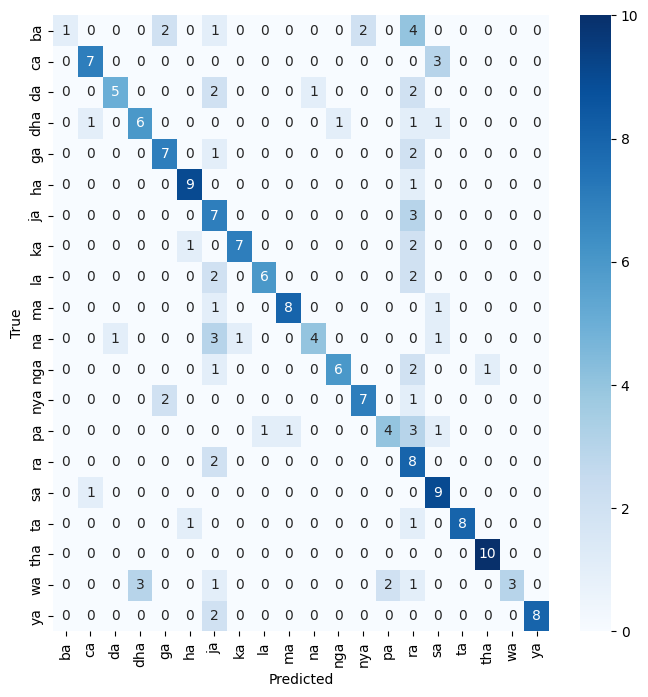

7/7 [==============================] - 45s 6s/step - loss: 1.9367 - accuracy: 0.6500
Loss    : 1.937
Accuracy: 65.0%
FINISHED predicting with model 19 ... 

START predicting with model 20 ...
==== CONFUSION MATRIX FOR MODEL 20 ====


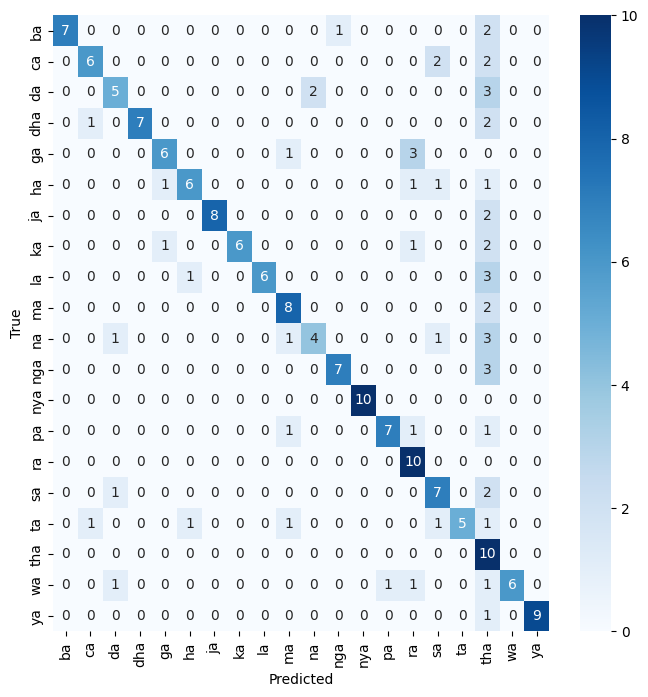

7/7 [==============================] - 44s 6s/step - loss: 1.7749 - accuracy: 0.7000
Loss    : 1.775
Accuracy: 70.0%
FINISHED predicting with model 20 ... 

START predicting with model 21 ...
==== CONFUSION MATRIX FOR MODEL 21 ====


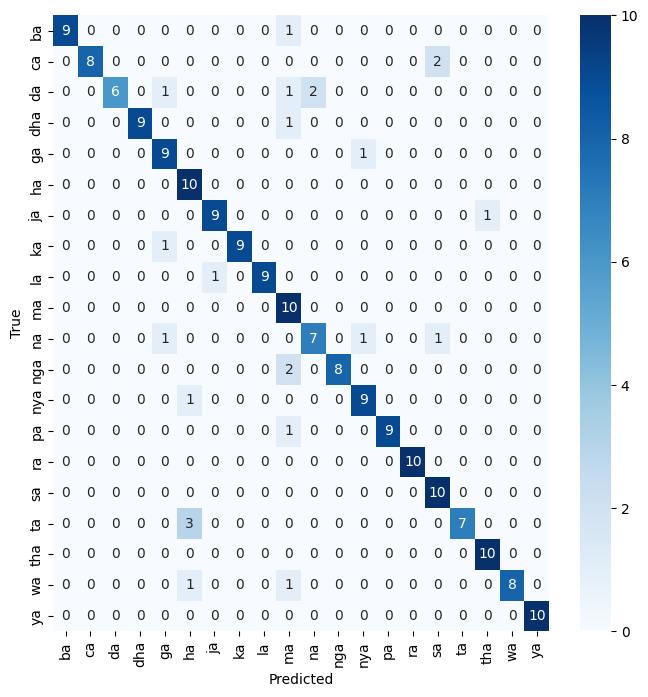

7/7 [==============================] - 23s 3s/step - loss: 0.5969 - accuracy: 0.8800
Loss    : 0.5969
Accuracy: 88.0%
FINISHED predicting with model 21 ... 

START predicting with model 22 ...
==== CONFUSION MATRIX FOR MODEL 22 ====


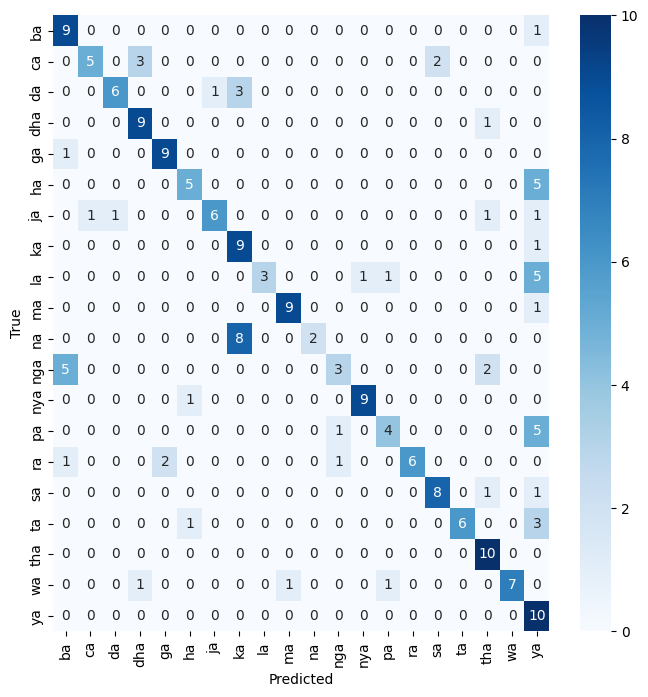

7/7 [==============================] - 21s 3s/step - loss: 1.0334 - accuracy: 0.6750
Loss    : 1.033
Accuracy: 67.5%
FINISHED predicting with model 22 ... 

START predicting with model 23 ...
==== CONFUSION MATRIX FOR MODEL 23 ====


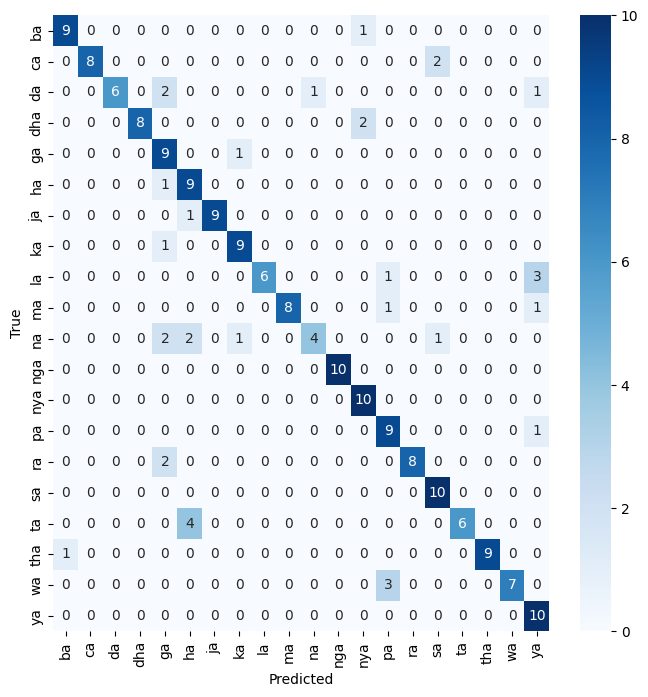

7/7 [==============================] - 21s 3s/step - loss: 0.7170 - accuracy: 0.8200
Loss    : 0.717
Accuracy: 82.0%
FINISHED predicting with model 23 ... 

START predicting with model 24 ...
==== CONFUSION MATRIX FOR MODEL 24 ====


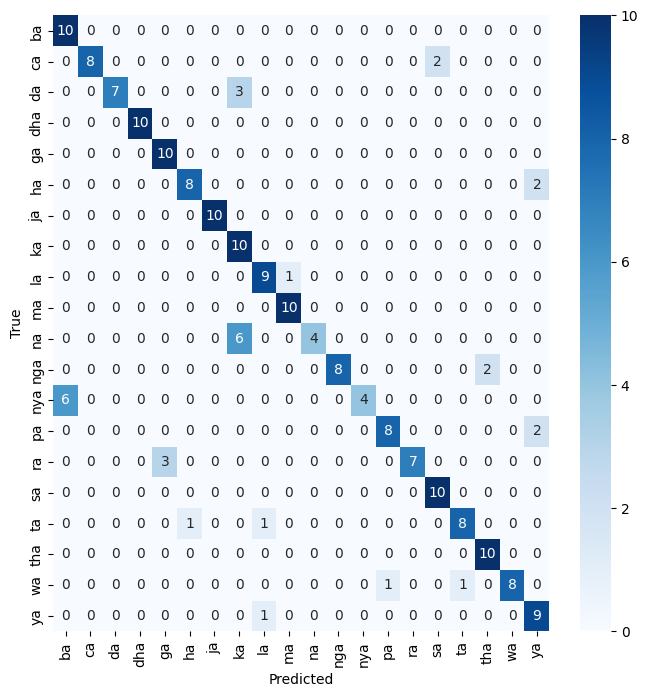

7/7 [==============================] - 21s 3s/step - loss: 0.7775 - accuracy: 0.8400
Loss    : 0.7775
Accuracy: 84.0%
FINISHED predicting with model 24 ... 

START predicting with model 25 ...
==== CONFUSION MATRIX FOR MODEL 25 ====


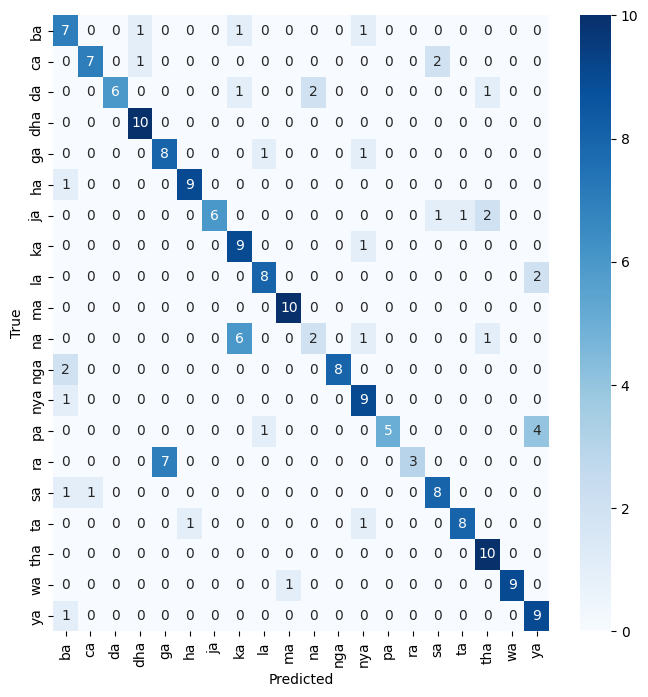

7/7 [==============================] - 21s 3s/step - loss: 0.8857 - accuracy: 0.7550
Loss    : 0.8857
Accuracy: 75.5%
FINISHED predicting with model 25 ... 

START predicting with model 26 ...
==== CONFUSION MATRIX FOR MODEL 26 ====


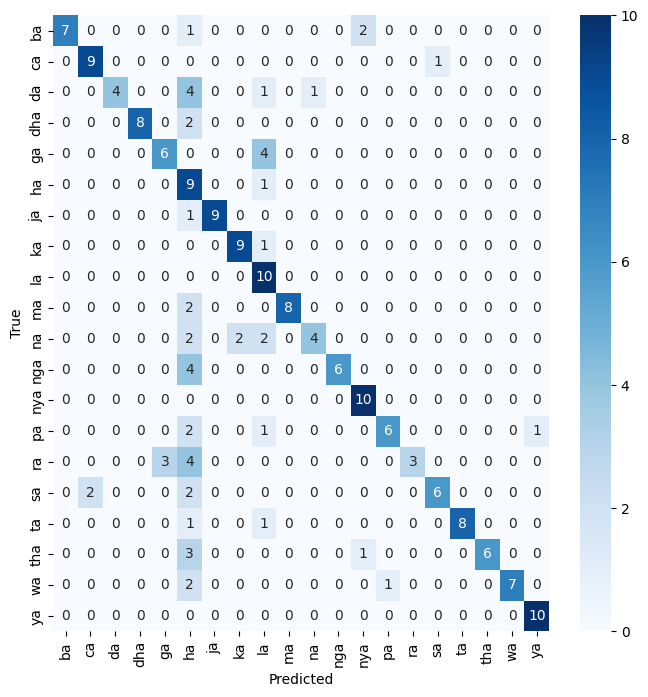

7/7 [==============================] - 22s 3s/step - loss: 1.6557 - accuracy: 0.7250
Loss    : 1.656
Accuracy: 72.5%
FINISHED predicting with model 26 ... 

START predicting with model 27 ...
==== CONFUSION MATRIX FOR MODEL 27 ====


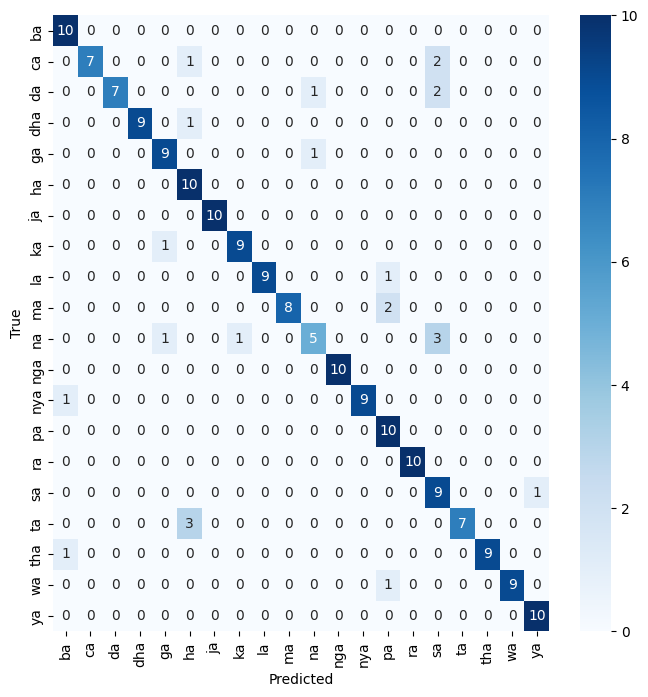

7/7 [==============================] - 21s 3s/step - loss: 0.5197 - accuracy: 0.8800
Loss    : 0.5197
Accuracy: 88.0%
FINISHED predicting with model 27 ... 

START predicting with model 28 ...
==== CONFUSION MATRIX FOR MODEL 28 ====


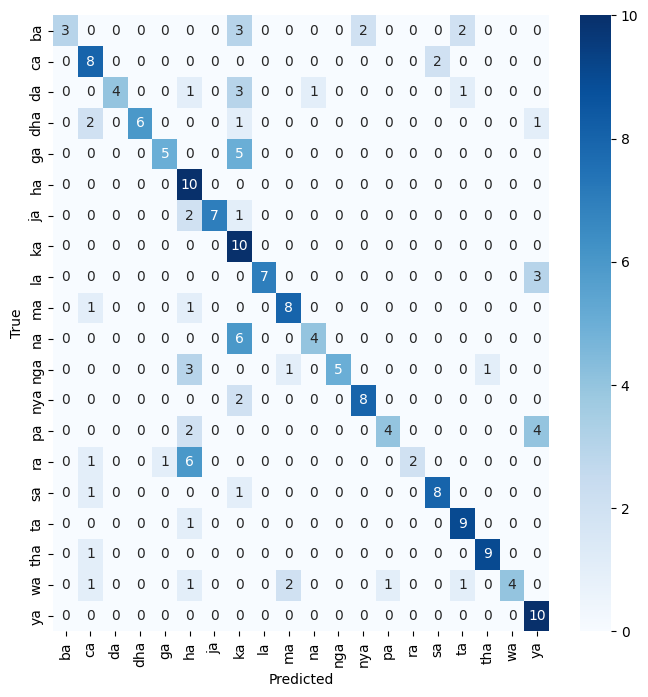

7/7 [==============================] - 21s 3s/step - loss: 1.7674 - accuracy: 0.6550
Loss    : 1.767
Accuracy: 65.5%
FINISHED predicting with model 28 ... 

START predicting with model 29 ...
==== CONFUSION MATRIX FOR MODEL 29 ====


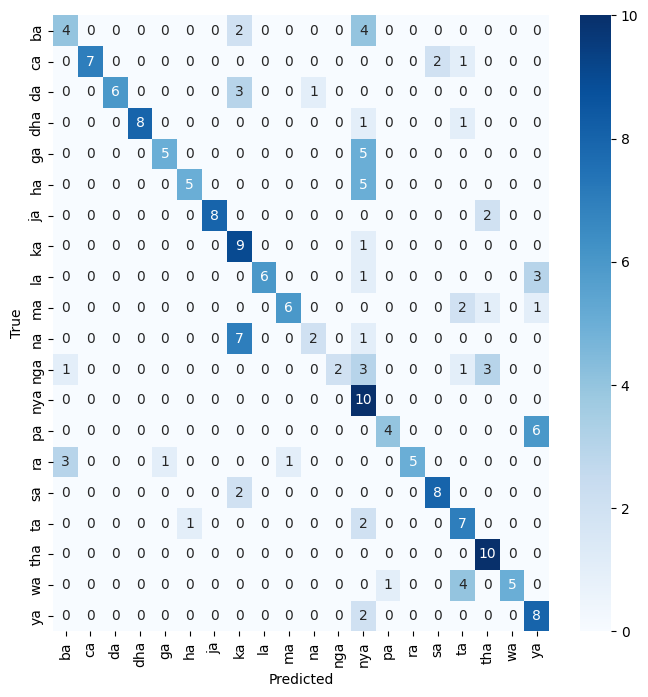

7/7 [==============================] - 21s 3s/step - loss: 1.3284 - accuracy: 0.6250
Loss    : 1.328
Accuracy: 62.5%
FINISHED predicting with model 29 ... 

START predicting with model 30 ...
==== CONFUSION MATRIX FOR MODEL 30 ====


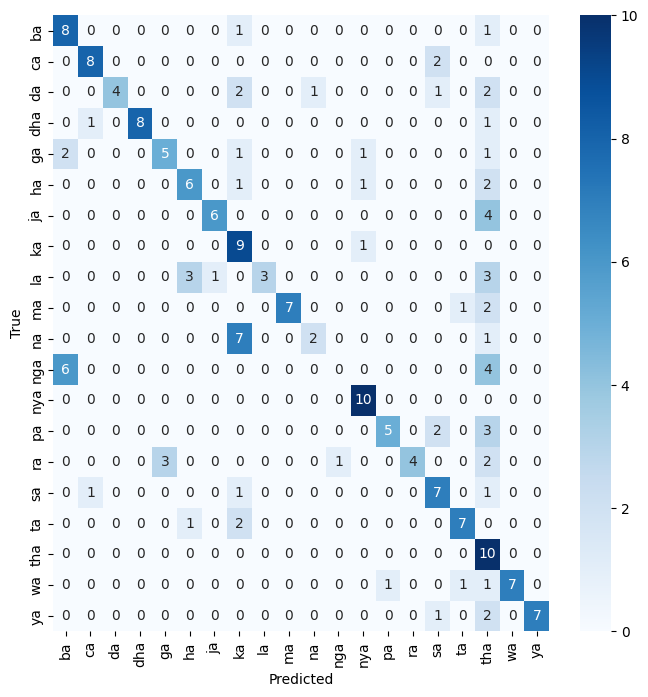

7/7 [==============================] - 22s 3s/step - loss: 1.4116 - accuracy: 0.6150
Loss    : 1.412
Accuracy: 61.5%
FINISHED predicting with model 30 ... 



In [15]:
results = pd.DataFrame(columns=['model_id', 'loss', 'accuracy'])

for id, model in loaded_models.items():
   
   print(f'START predicting with model {id} ...')
   
   y_pred = []  # store predicted labels
   y_true = []  # store true labels

   # iterate over the dataset
   for image_batch, label_batch in real_test_ds_mapped:   # use dataset.unbatch() with repeat
      # append true labels
      y_true.append(label_batch)
      # compute predictions
      preds = model.predict(image_batch, verbose=0)
      # append predicted labels
      y_pred.append(np.argmax(preds, axis = - 1))

   # convert the true and predicted labels into tensors
   correct_labels = tf.concat([item for item in y_true], axis = 0)
   predicted_labels = tf.concat([item for item in y_pred], axis = 0)

   print(f'==== CONFUSION MATRIX FOR MODEL {id} ====')
   plot_confusion_m(correct_labels, predicted_labels, class_names, figsize=(8,8))
   
   loss, acc = model.evaluate(real_test_ds_mapped)
   print("Loss    : {:.4}".format(loss))
   print("Accuracy: {:.4}%".format(acc*100))
   
   result_df = pd.DataFrame({'model_id': [id], 'loss': [loss], 'accuracy': [acc]})
   results = pd.concat([results, result_df], ignore_index=True)
   
   print(f'FINISHED predicting with model {id} ... \n')

# Check Errors

==== MODEL 1 ====


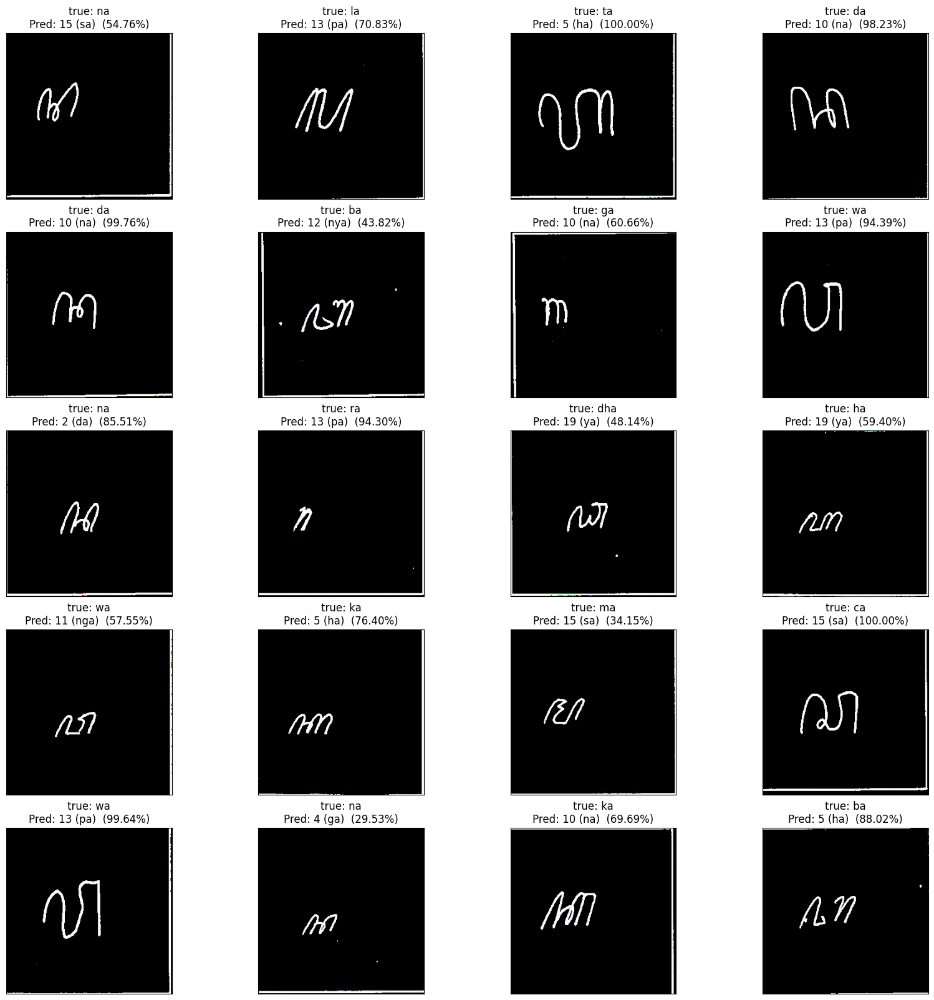

==== END MODEL 1 ====


==== MODEL 2 ====


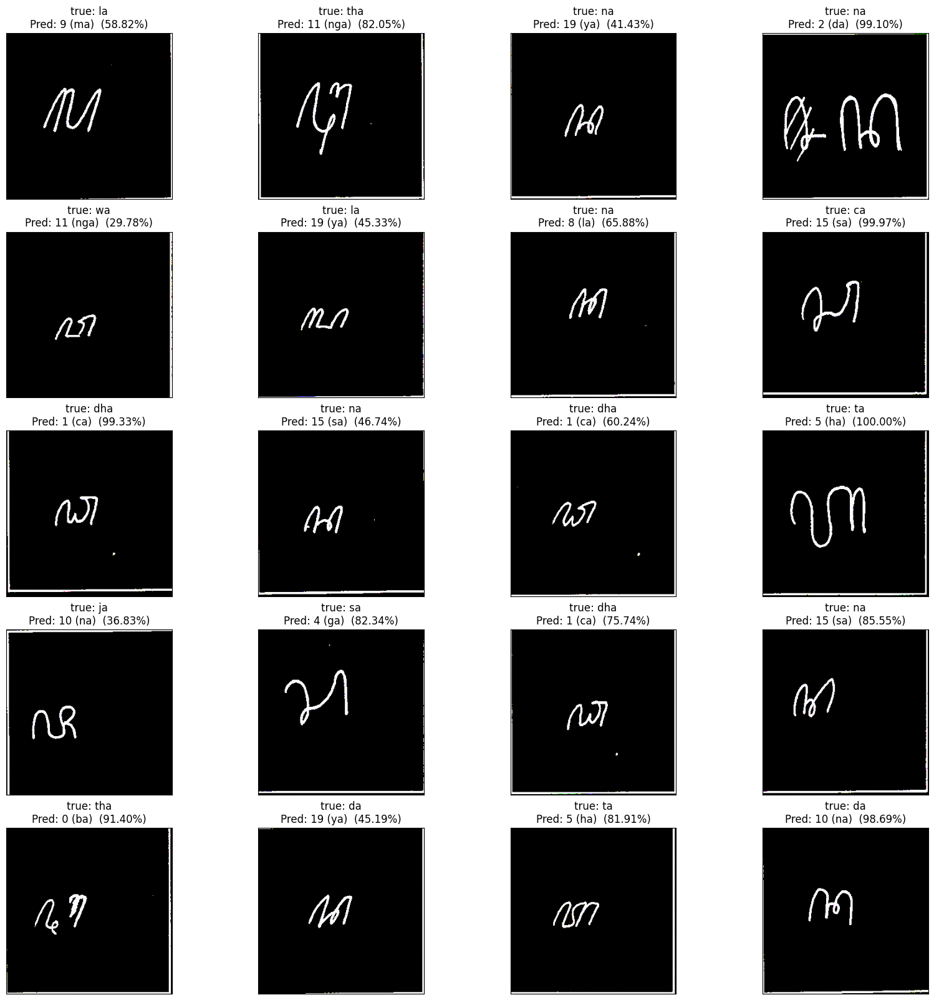

==== END MODEL 2 ====


==== MODEL 3 ====


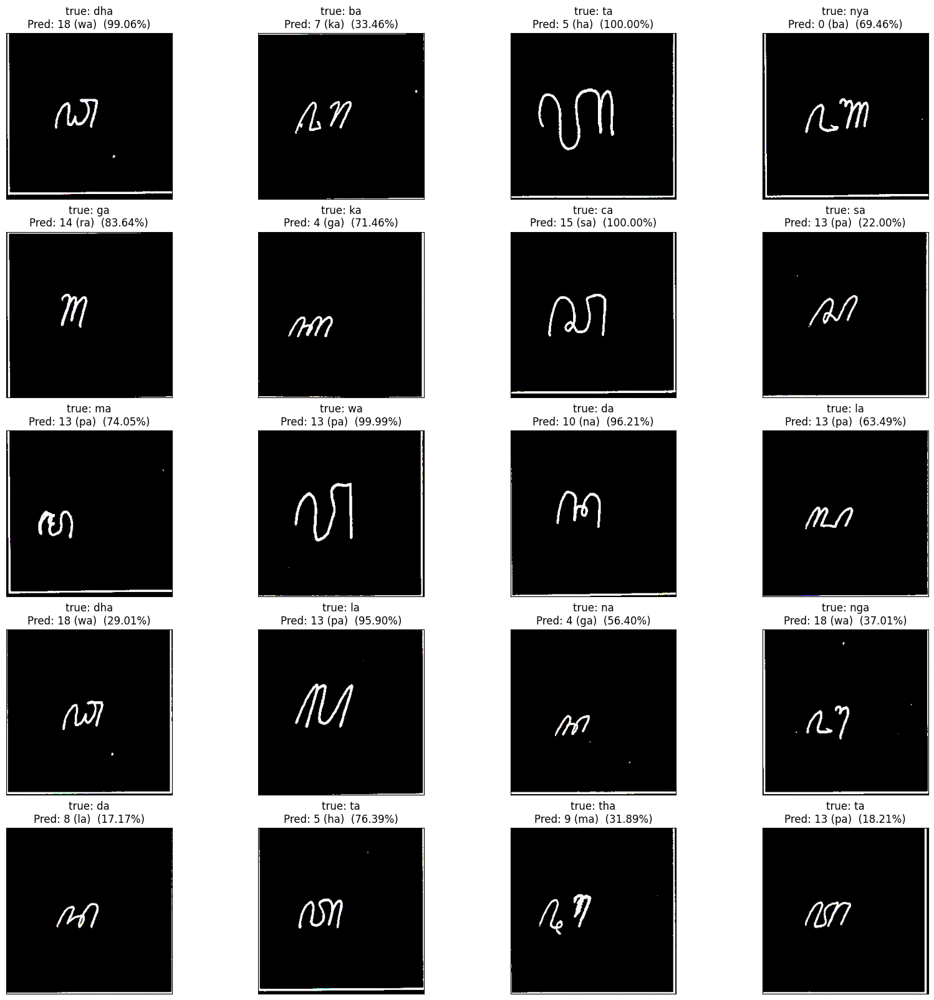

==== END MODEL 3 ====


==== MODEL 4 ====


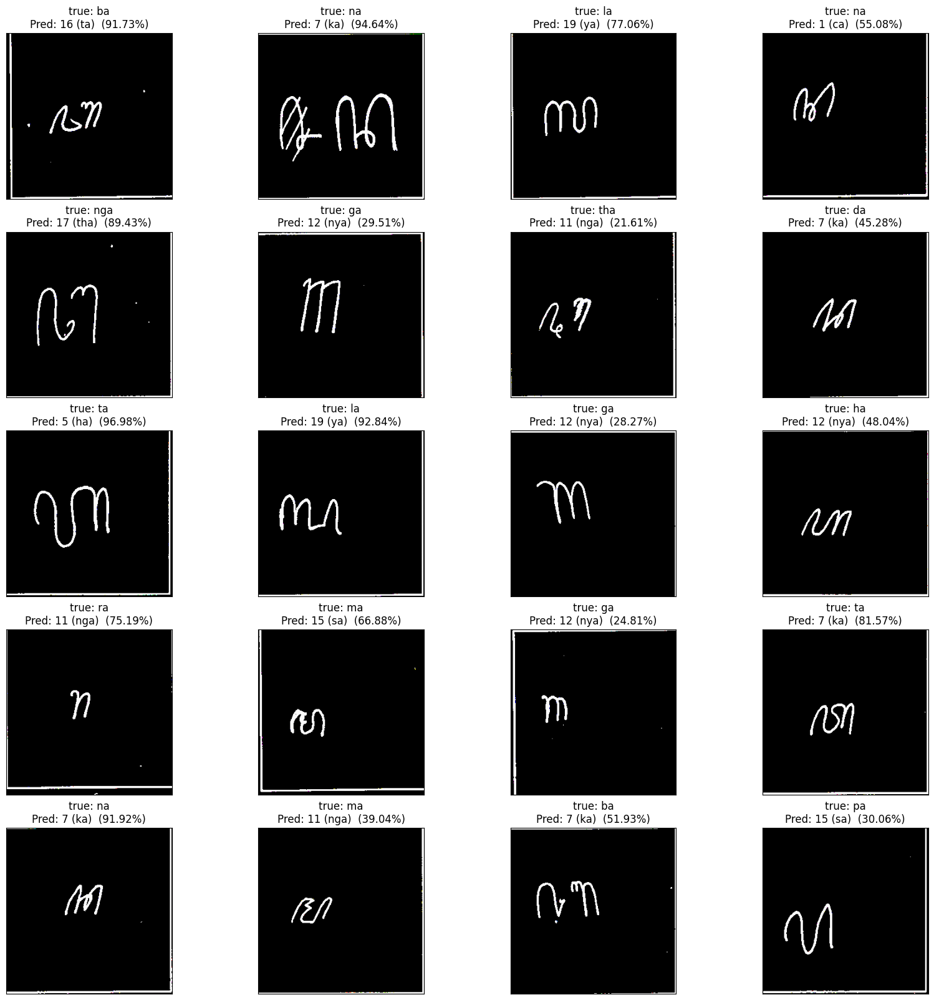

==== END MODEL 4 ====


==== MODEL 5 ====


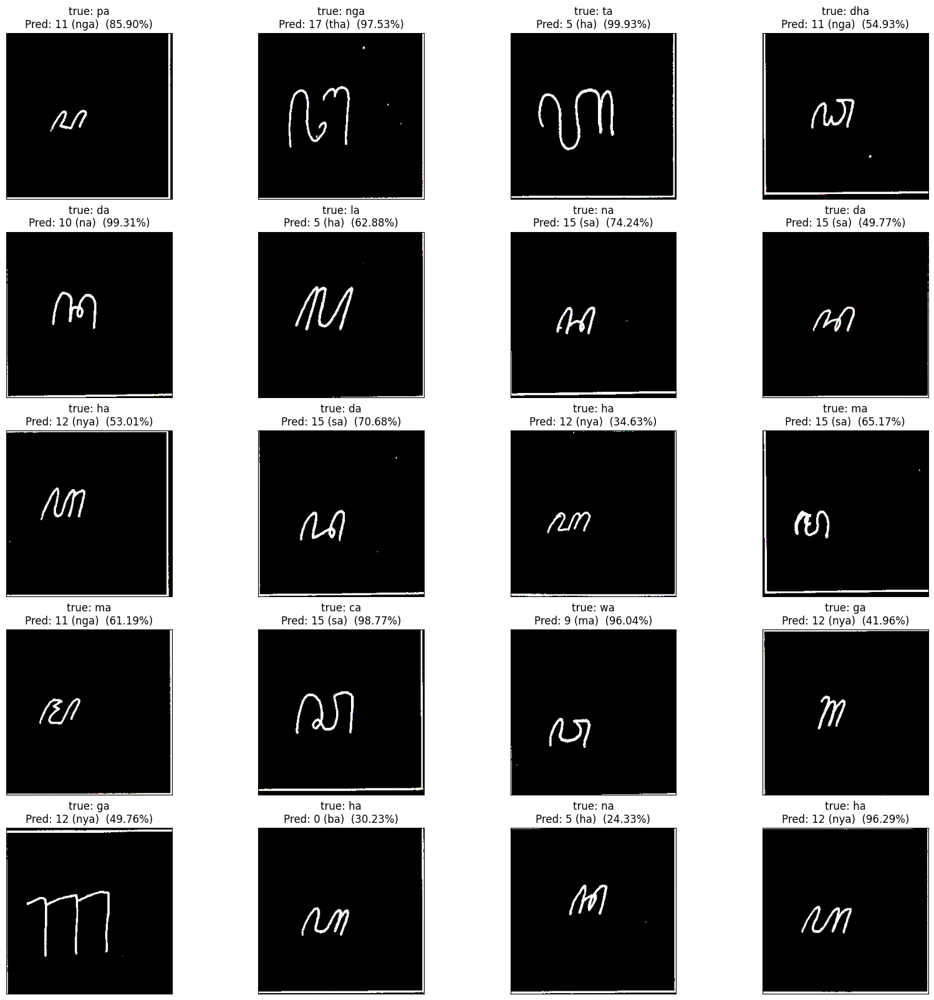

==== END MODEL 5 ====


==== MODEL 6 ====


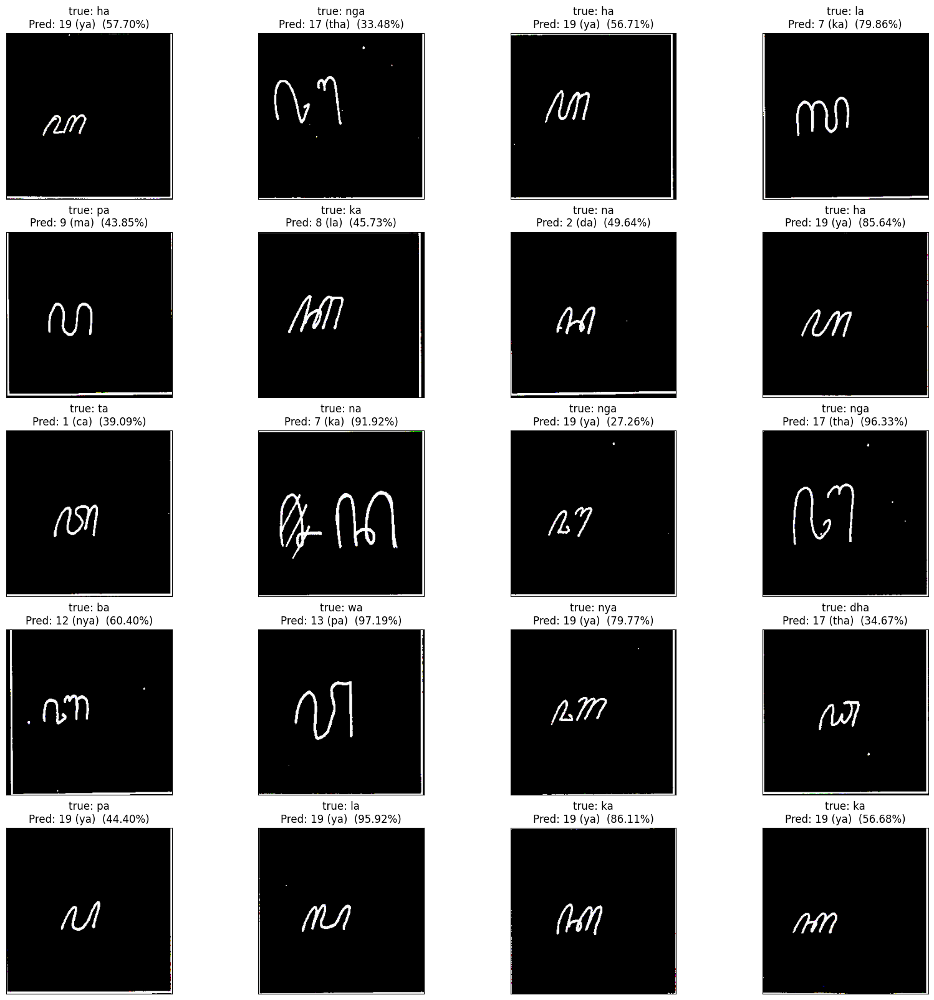

==== END MODEL 6 ====


==== MODEL 7 ====


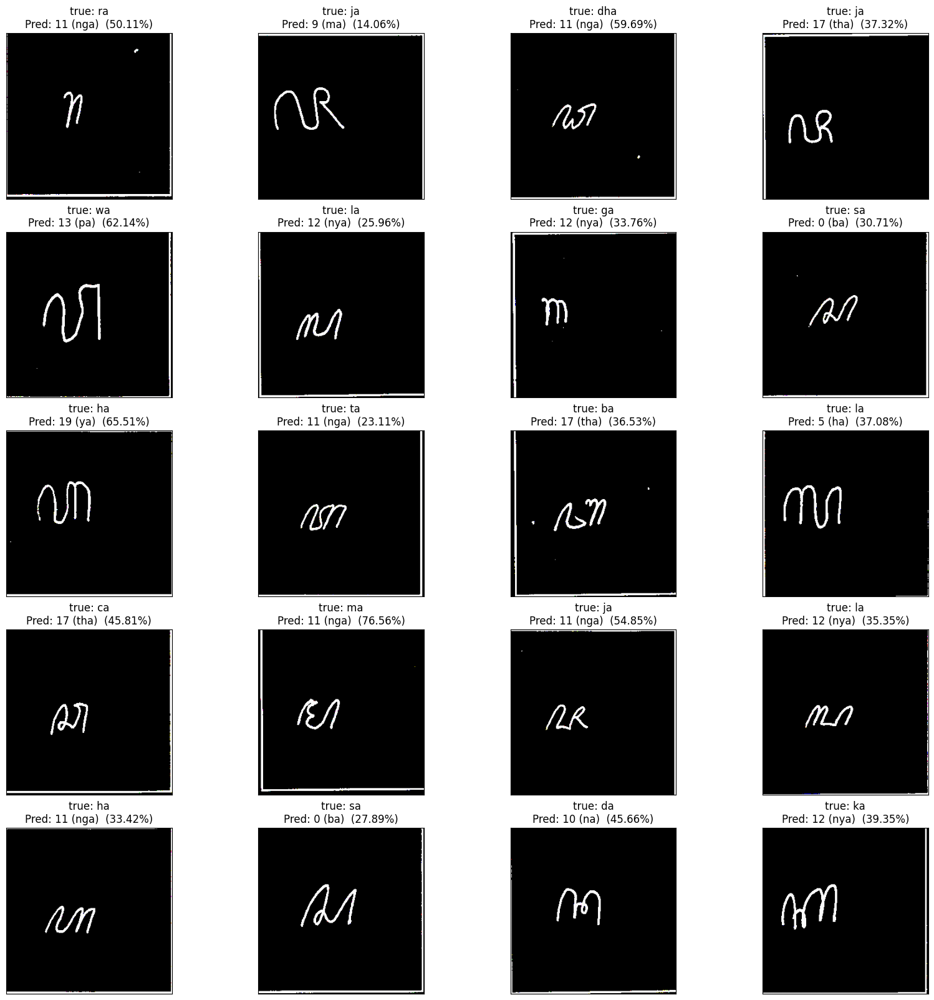

==== END MODEL 7 ====


==== MODEL 8 ====


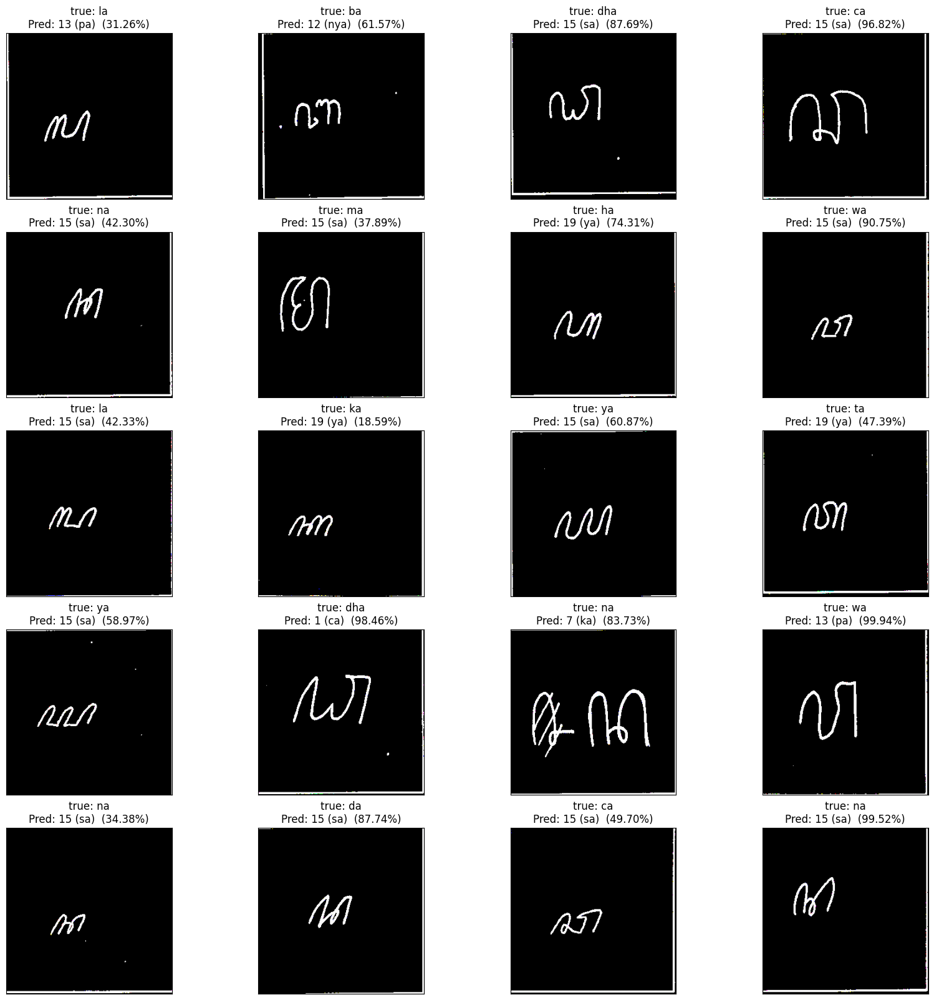

==== END MODEL 8 ====


==== MODEL 9 ====


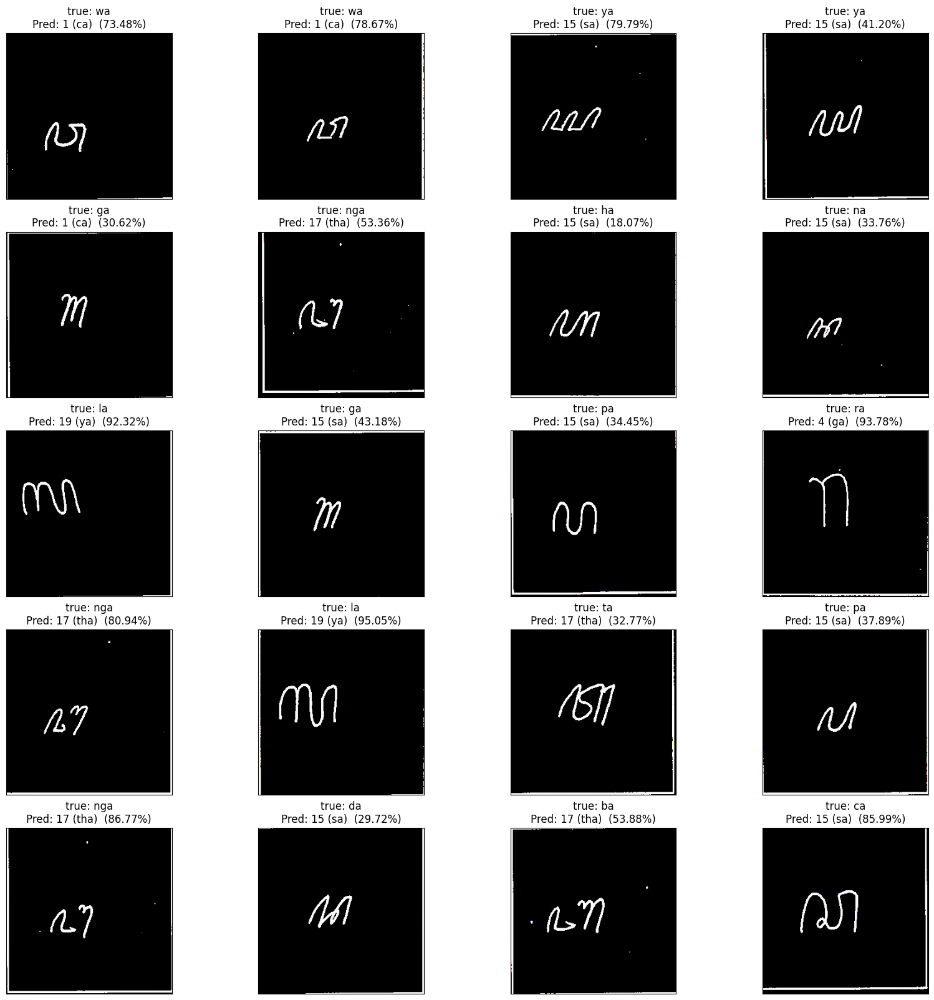

==== END MODEL 9 ====


==== MODEL 10 ====


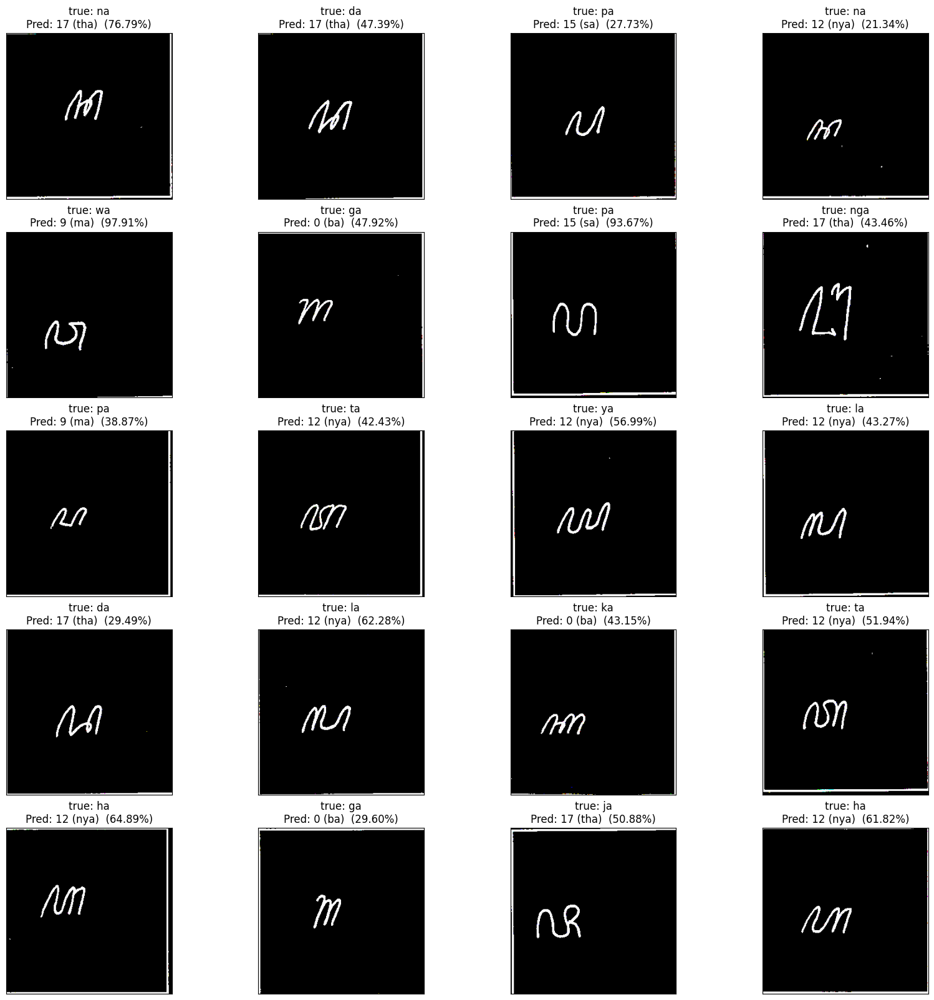

==== END MODEL 10 ====


==== MODEL 11 ====


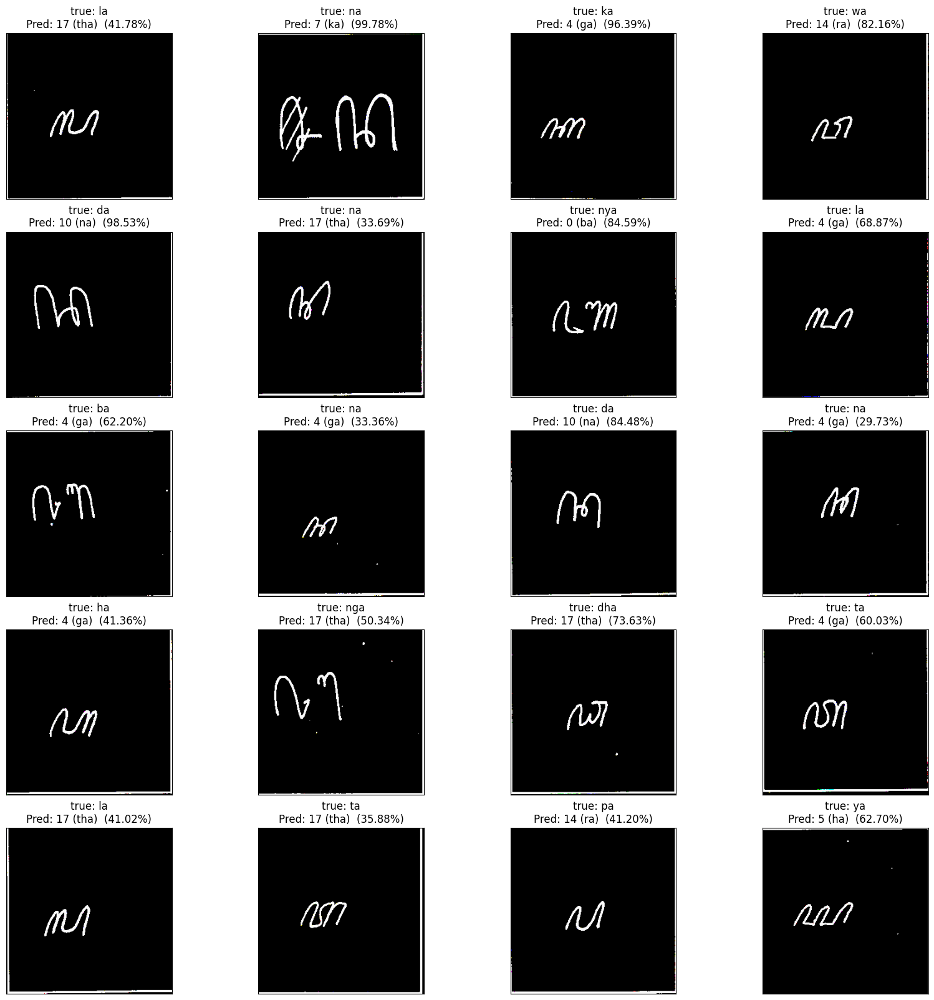

==== END MODEL 11 ====


==== MODEL 12 ====


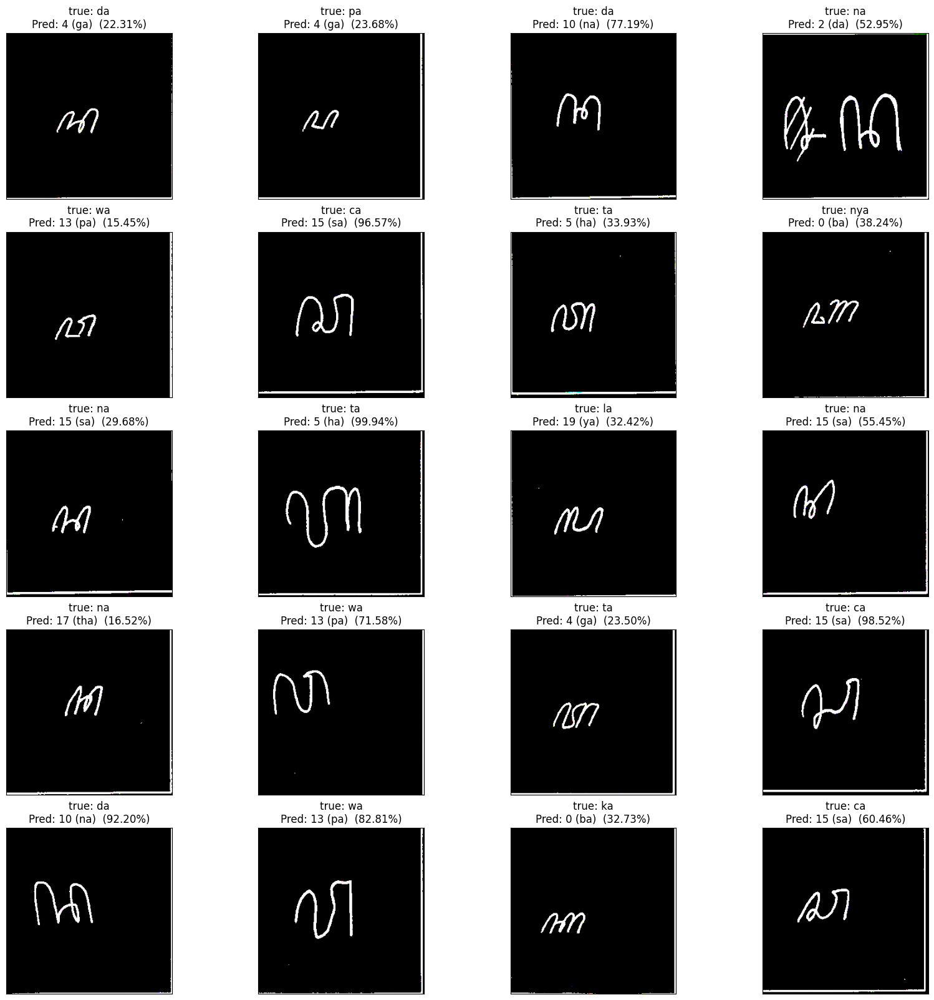

==== END MODEL 12 ====


==== MODEL 13 ====


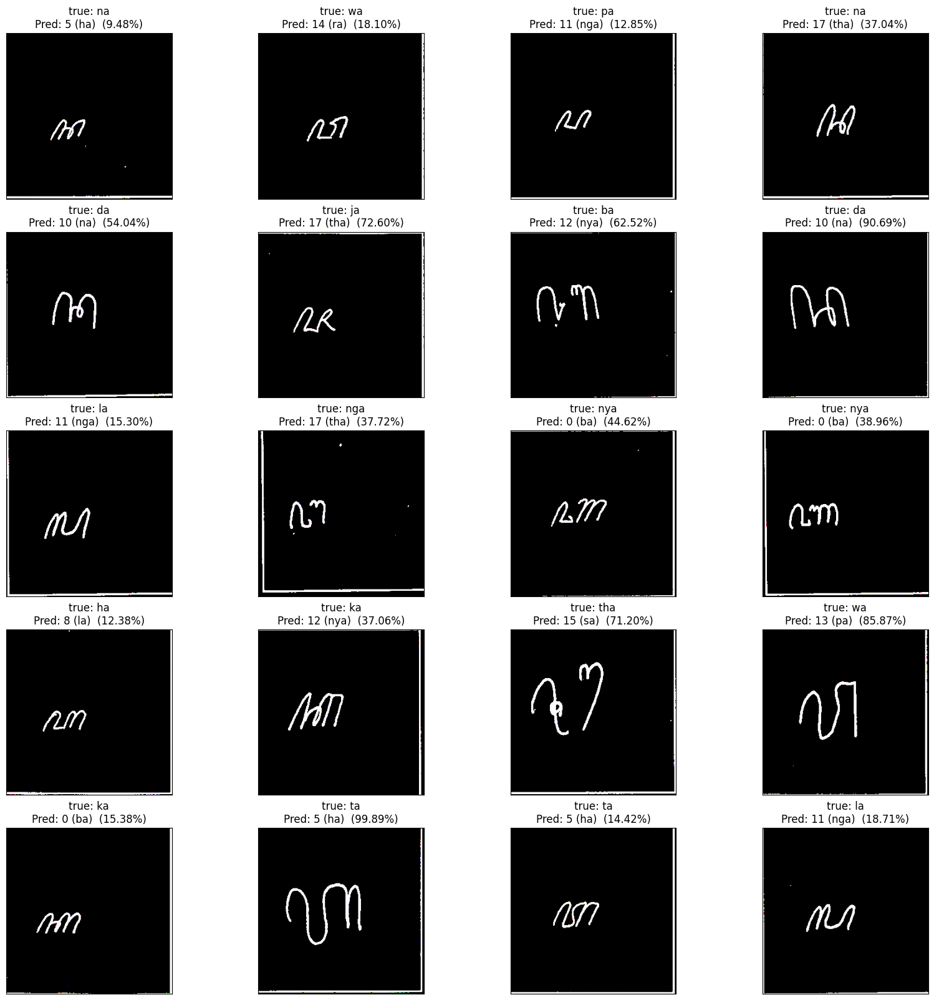

==== END MODEL 13 ====


==== MODEL 14 ====


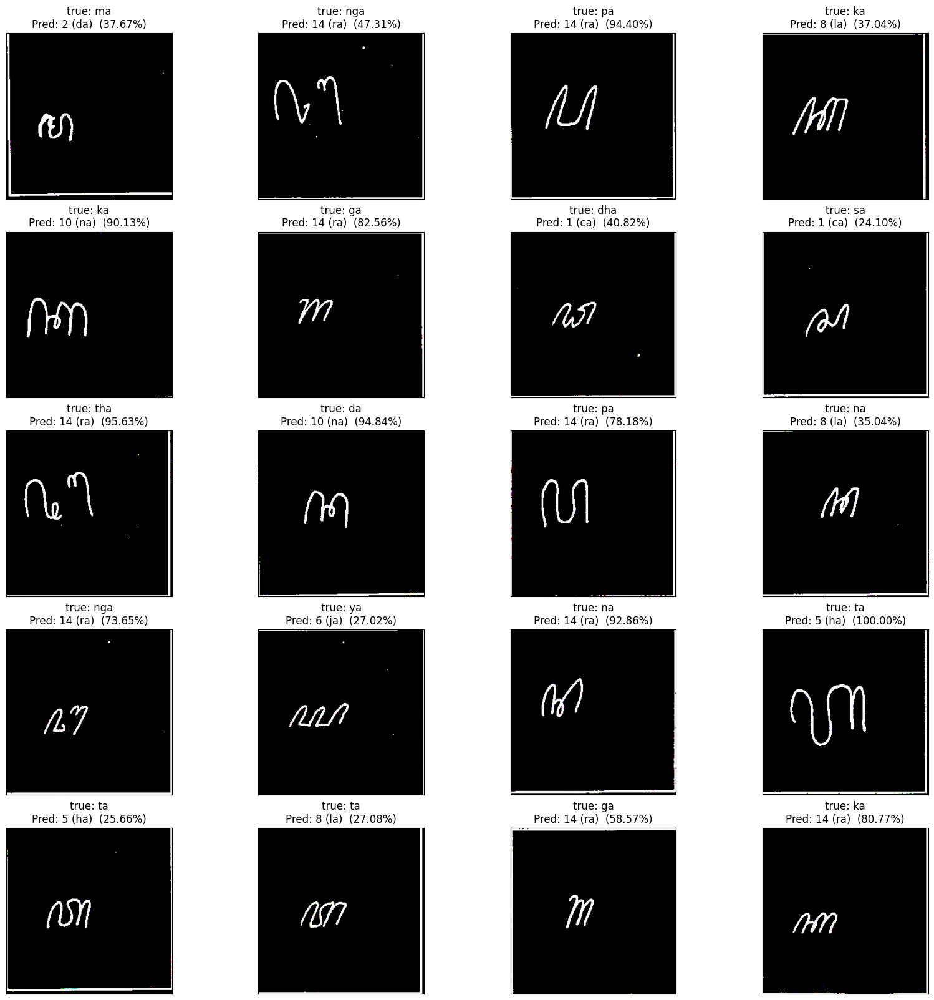

==== END MODEL 14 ====


==== MODEL 15 ====


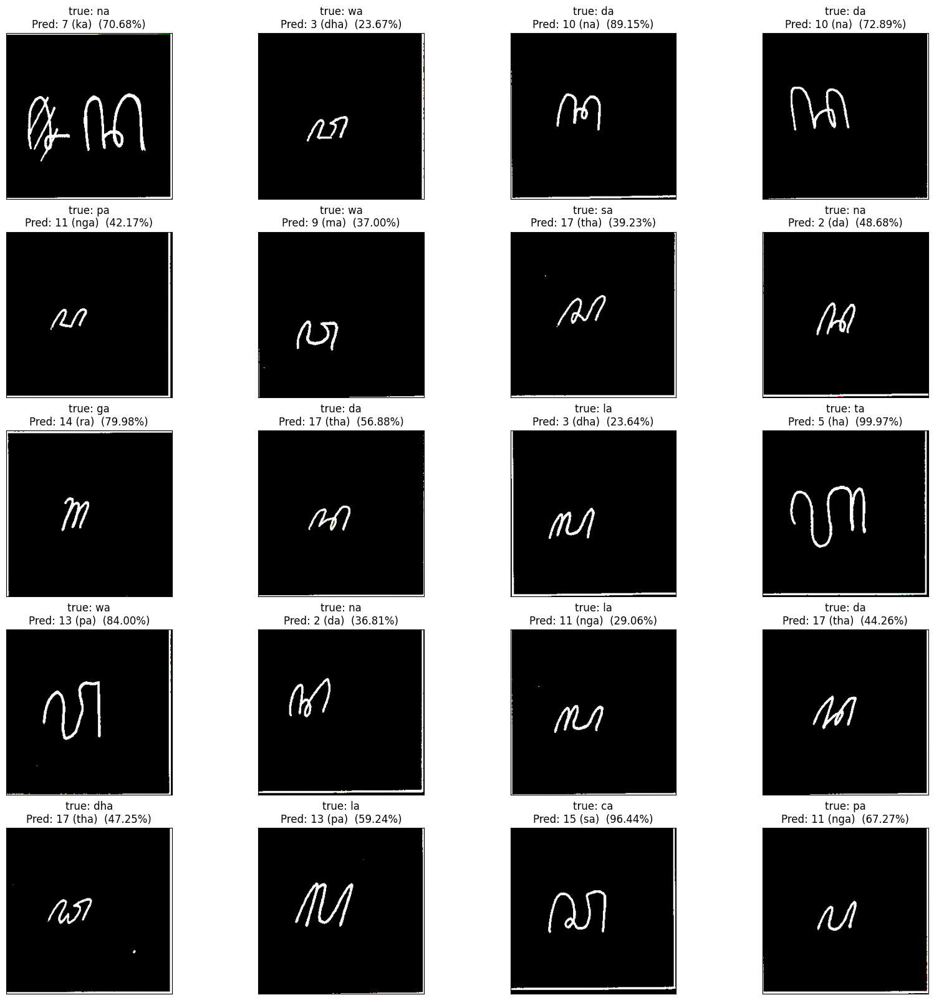

==== END MODEL 15 ====


==== MODEL 16 ====


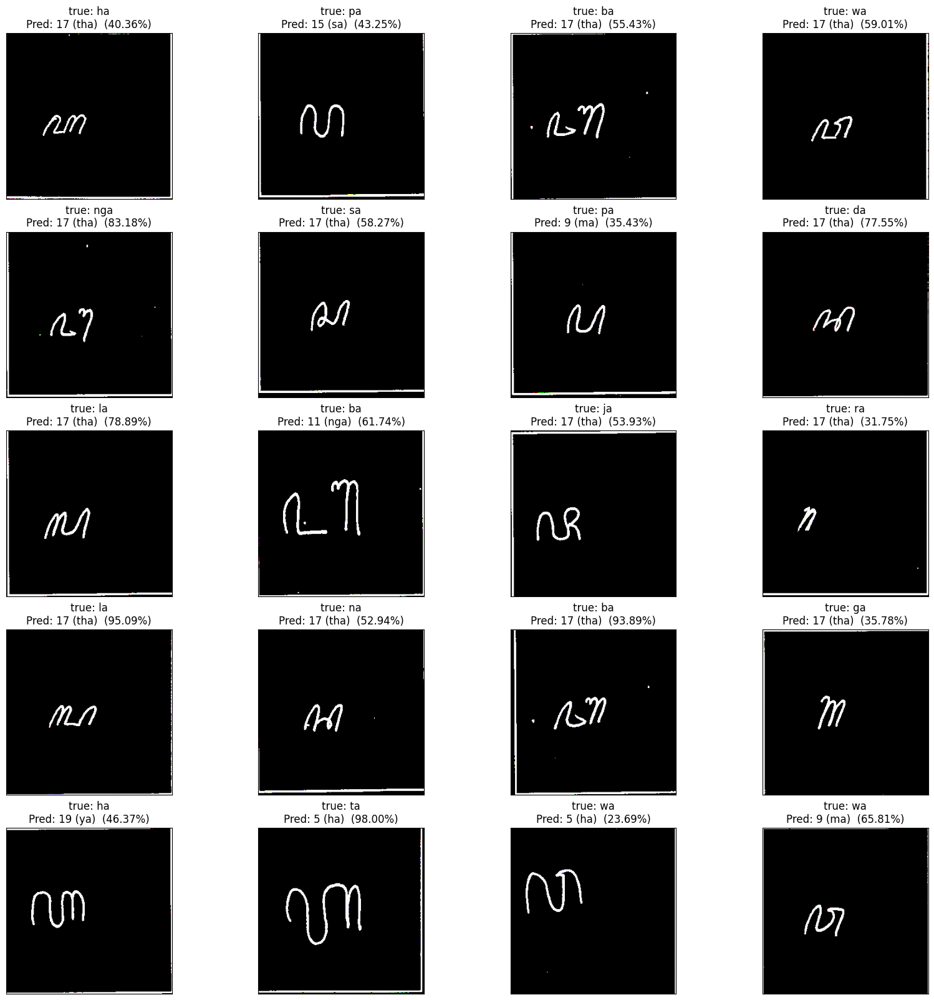

==== END MODEL 16 ====


==== MODEL 17 ====


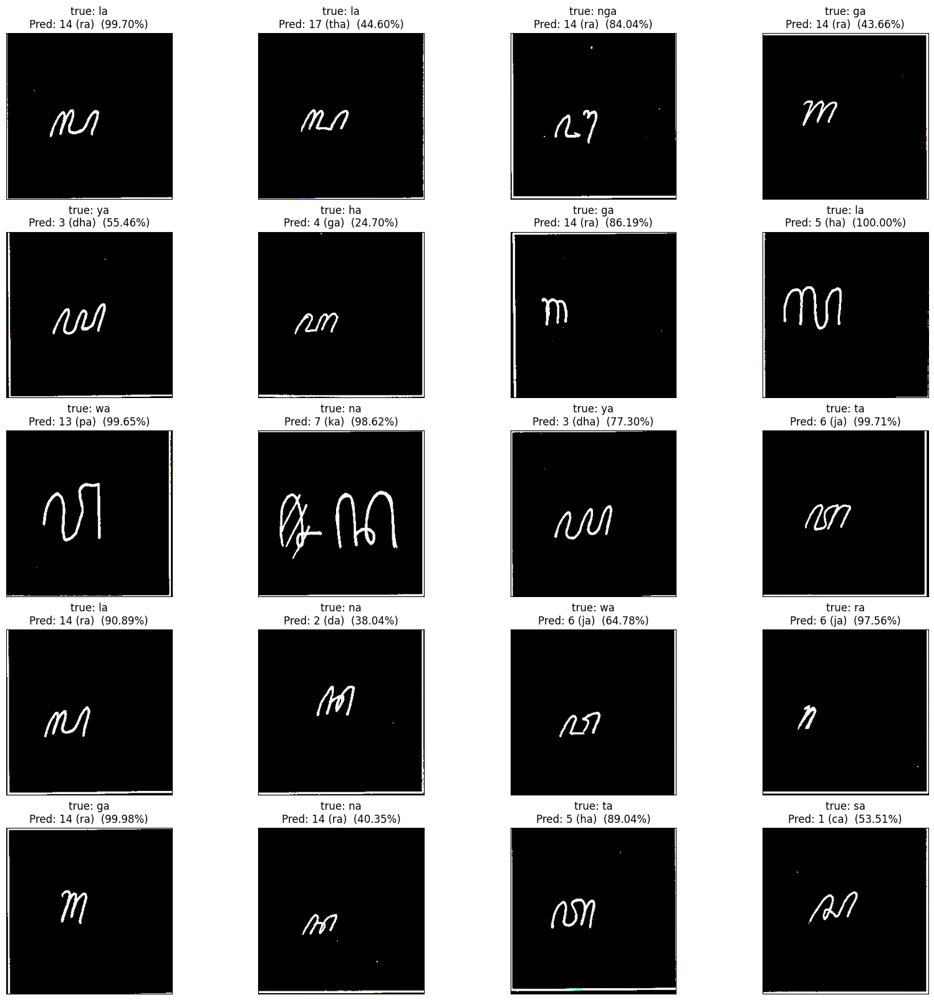

==== END MODEL 17 ====


==== MODEL 18 ====


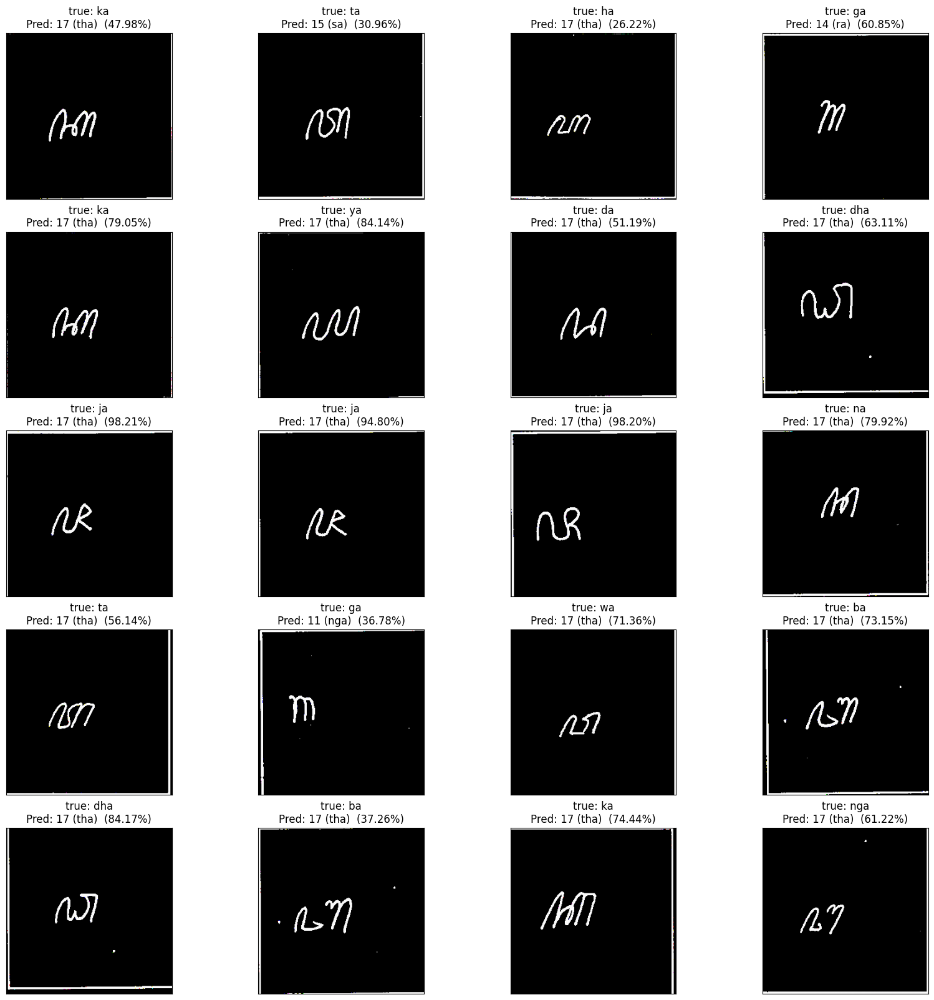

==== END MODEL 18 ====


==== MODEL 19 ====


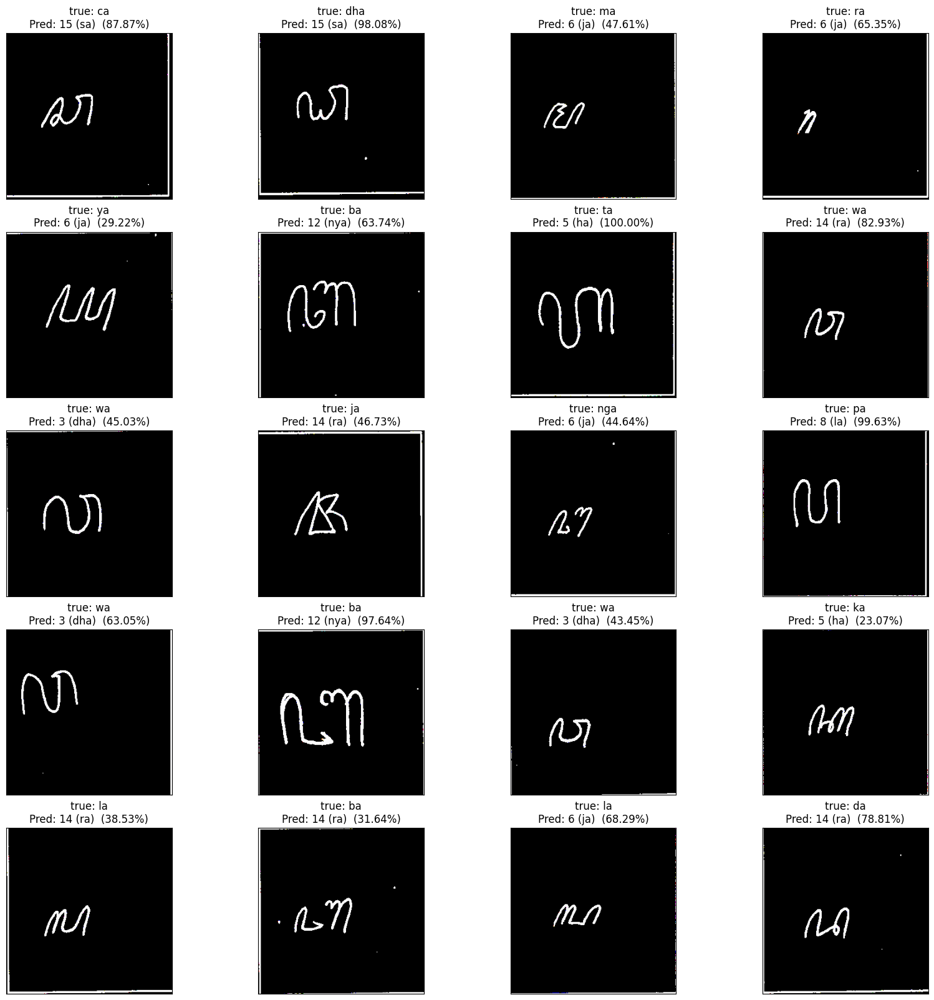

==== END MODEL 19 ====


==== MODEL 20 ====


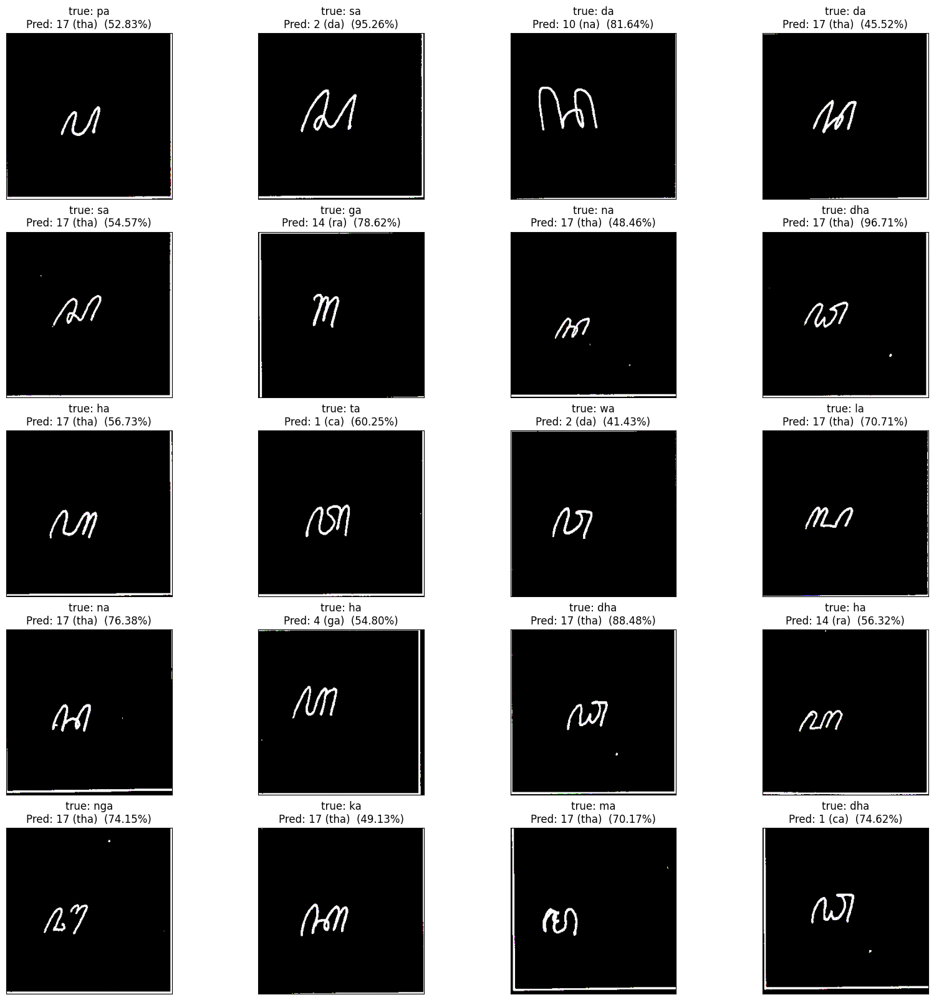

==== END MODEL 20 ====


==== MODEL 21 ====


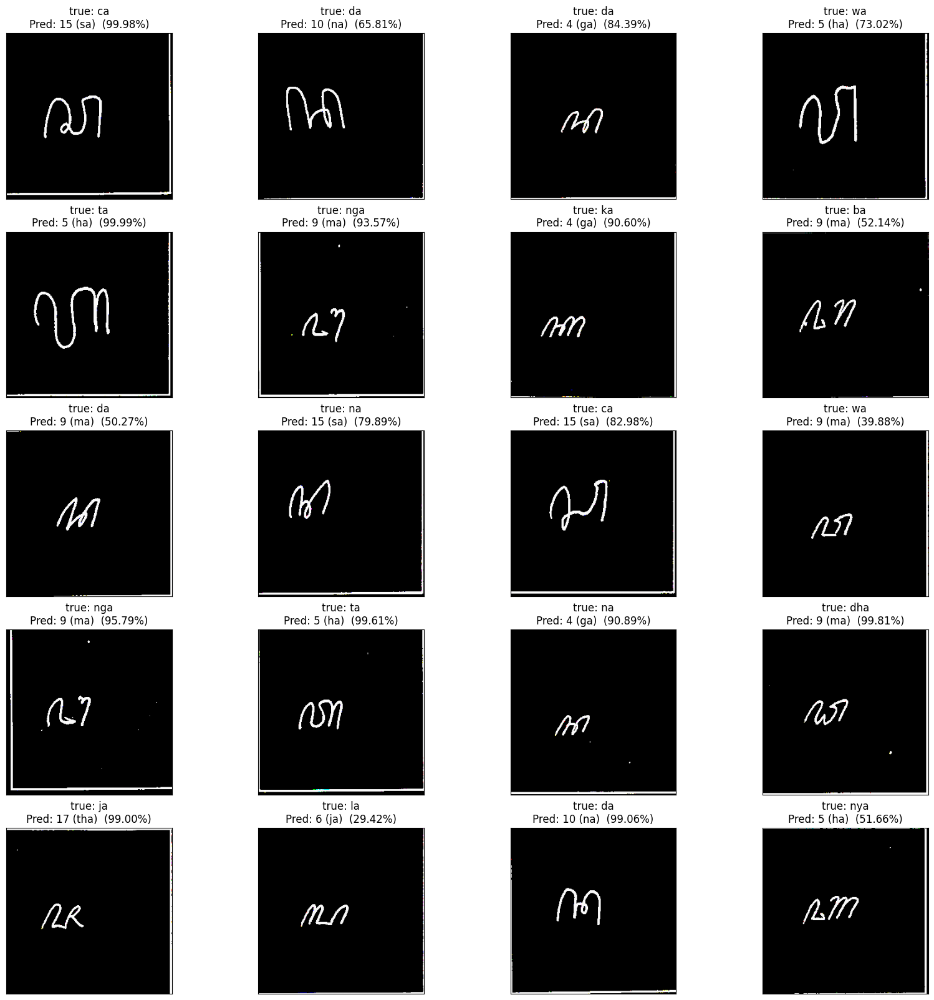

==== END MODEL 21 ====


==== MODEL 22 ====


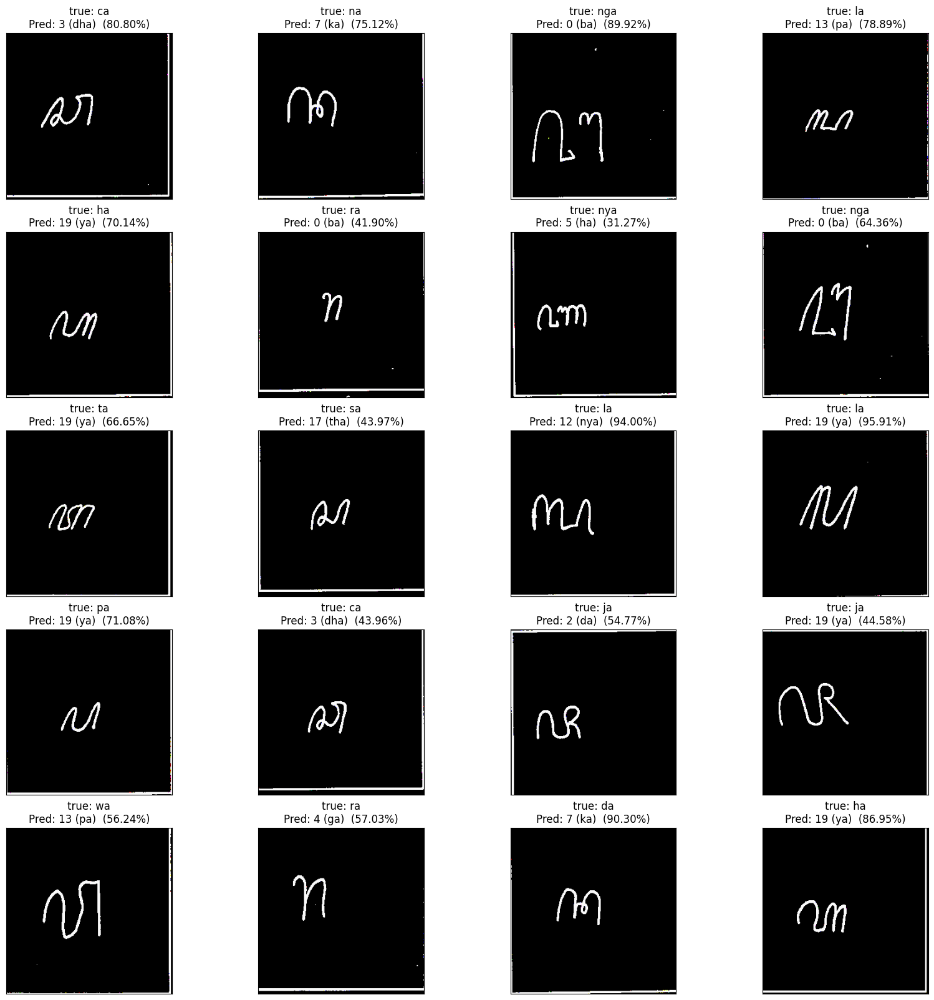

==== END MODEL 22 ====


==== MODEL 23 ====


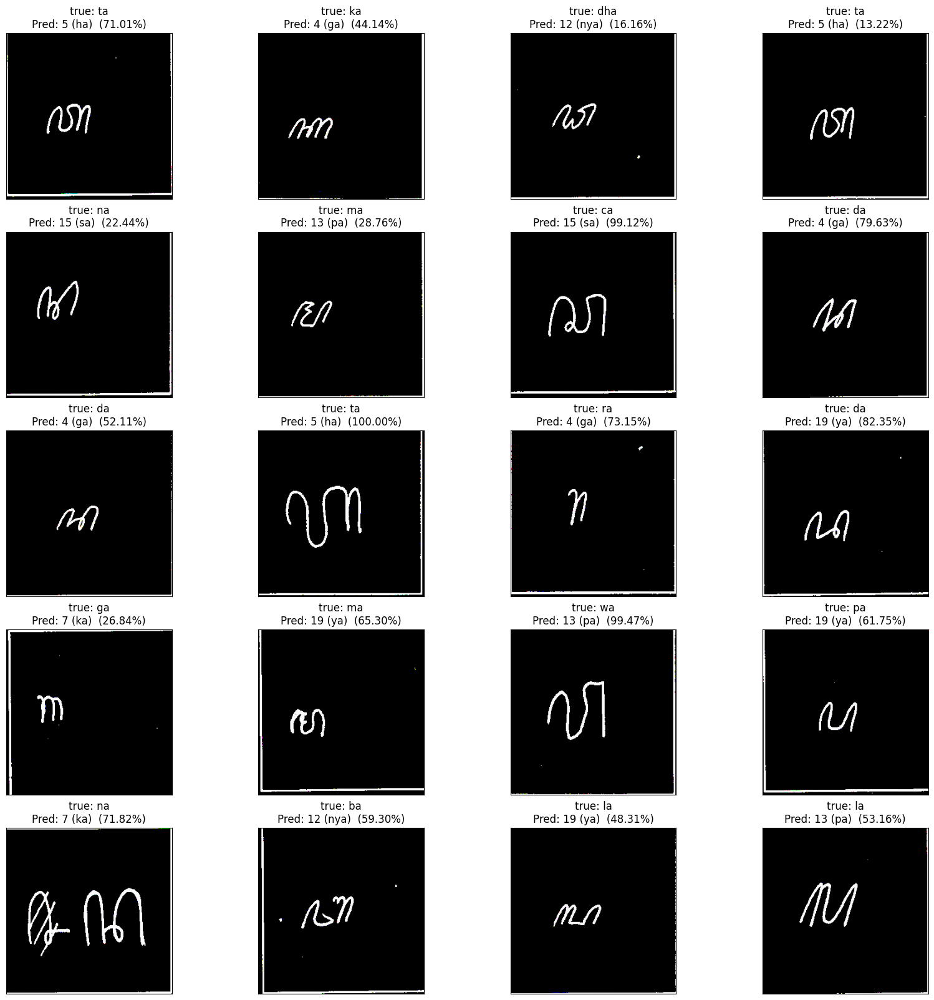

==== END MODEL 23 ====


==== MODEL 24 ====


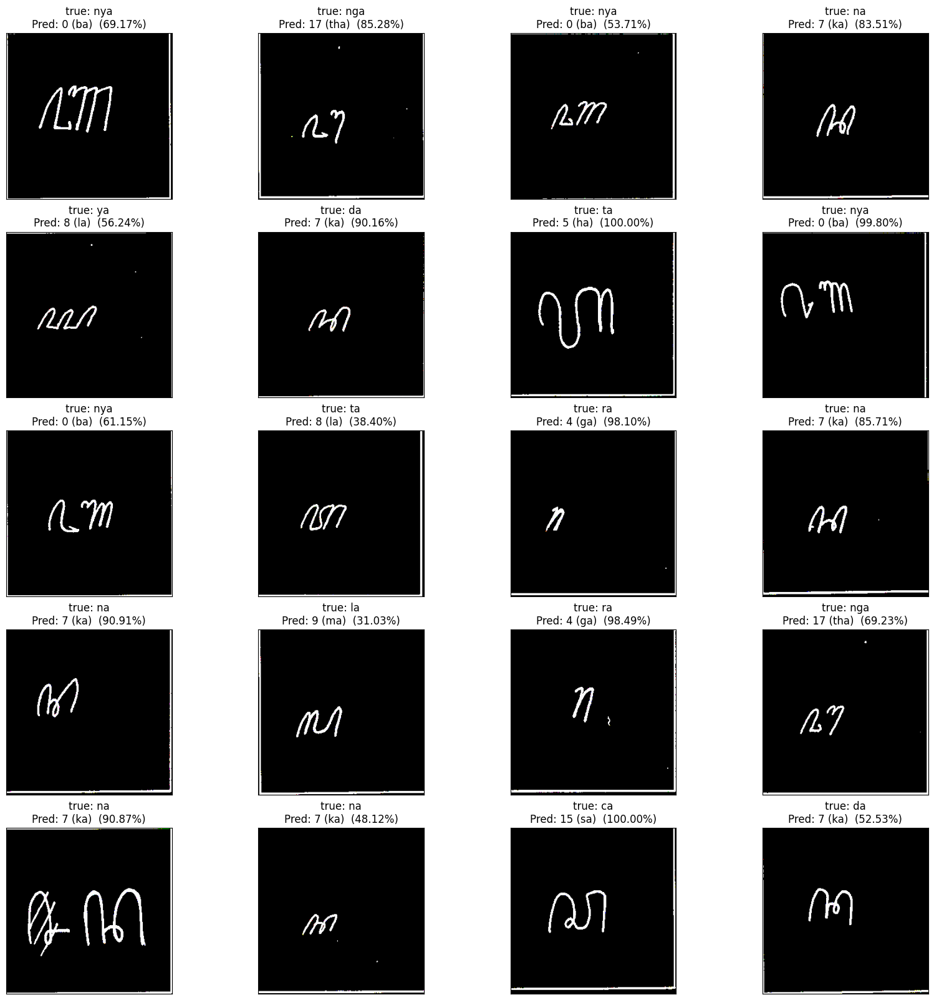

==== END MODEL 24 ====


==== MODEL 25 ====


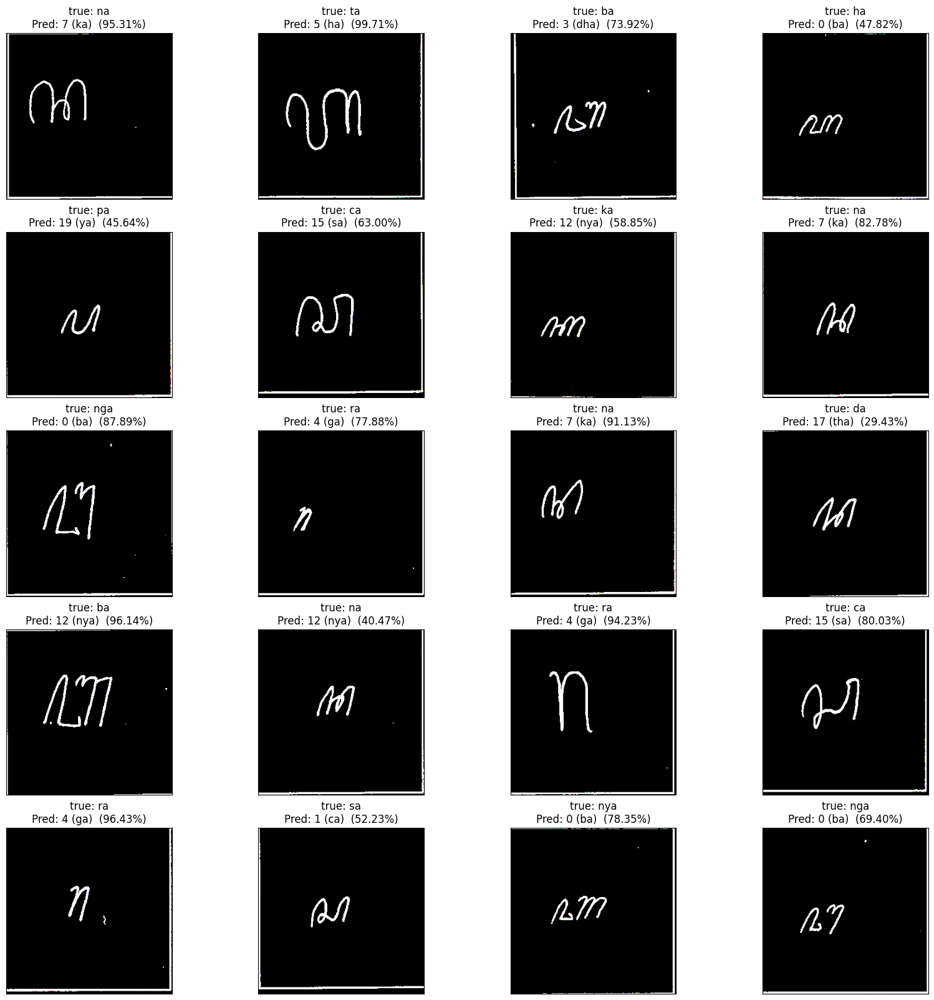

==== END MODEL 25 ====


==== MODEL 26 ====


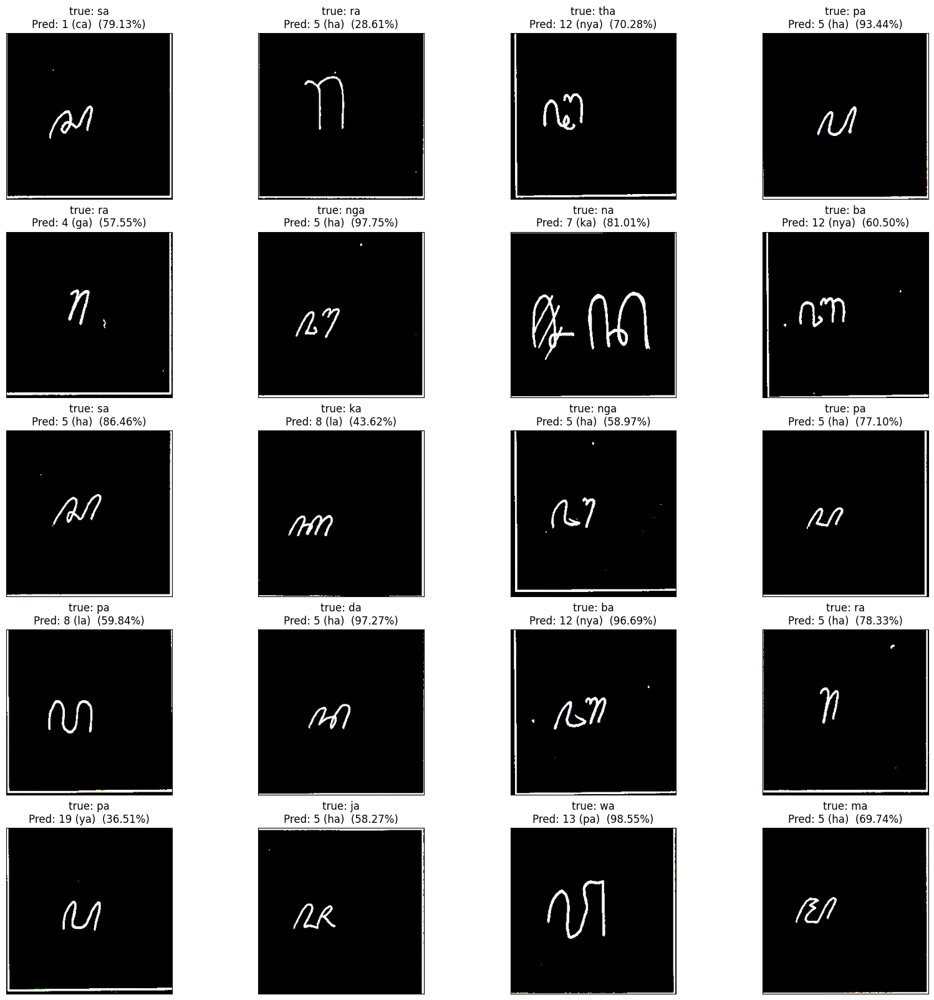

==== END MODEL 26 ====


==== MODEL 27 ====


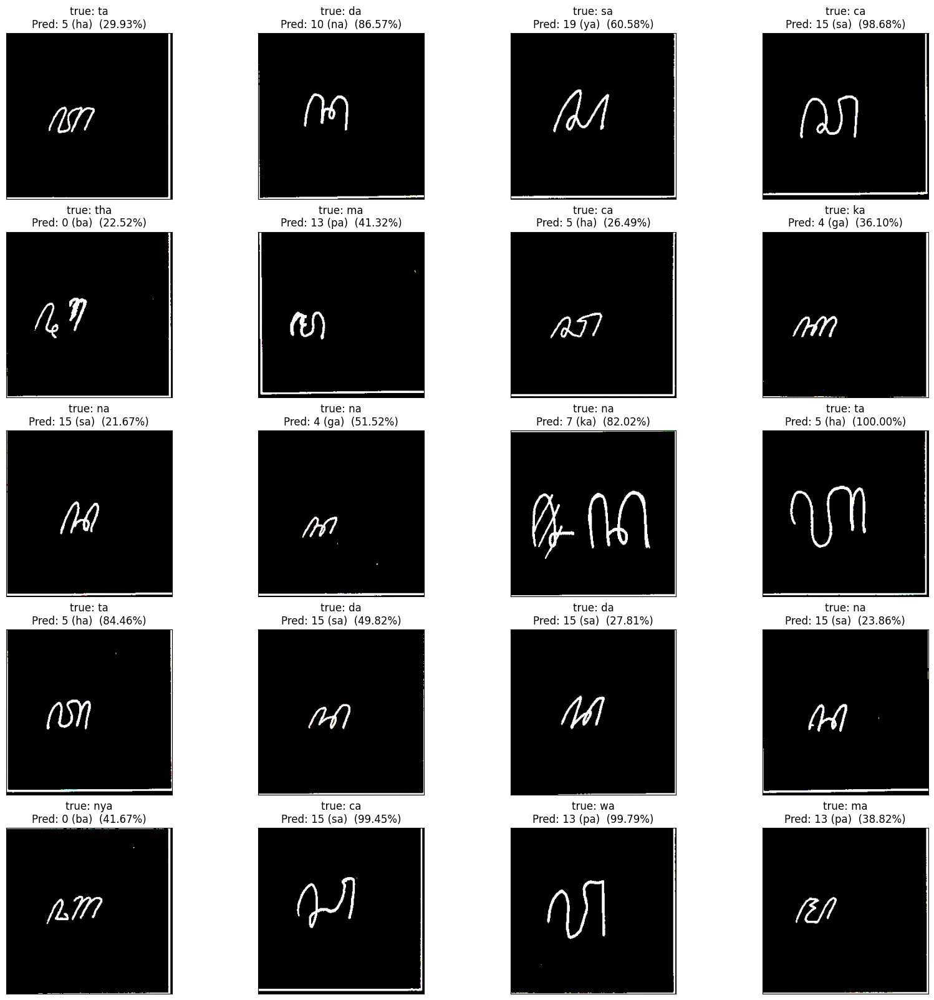

==== END MODEL 27 ====


==== MODEL 28 ====


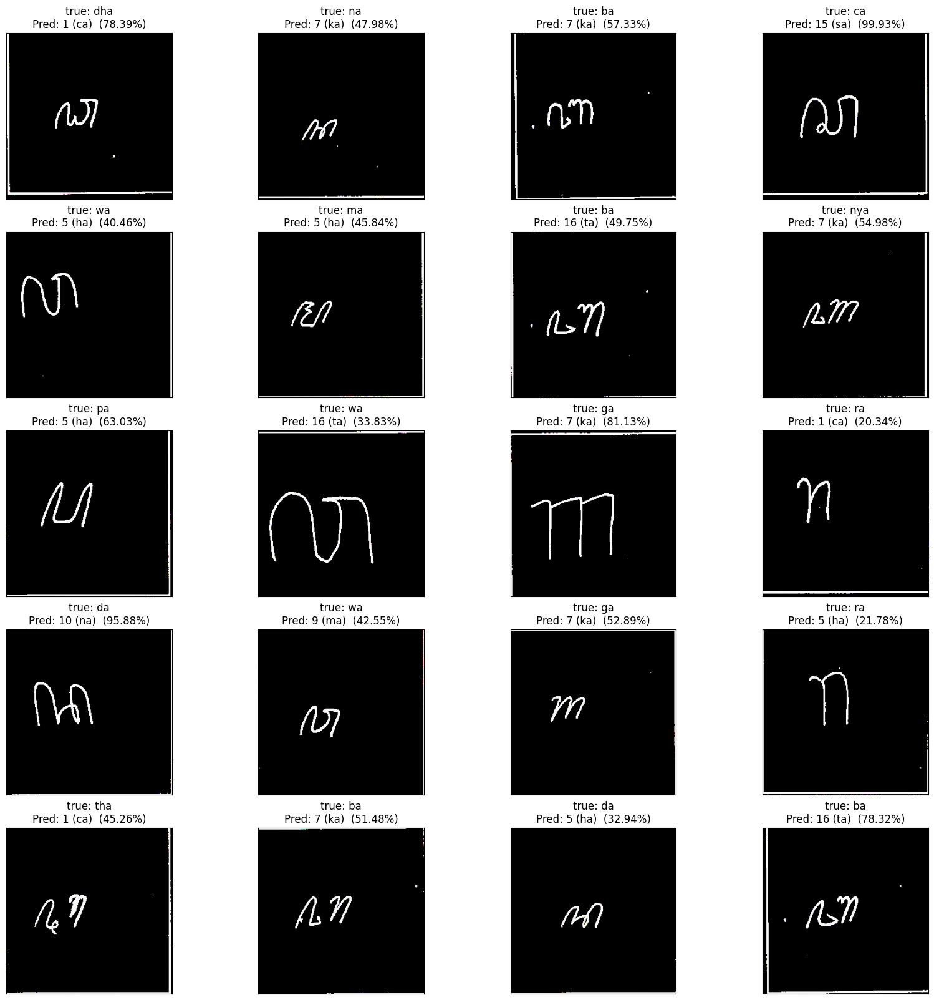

==== END MODEL 28 ====


==== MODEL 29 ====


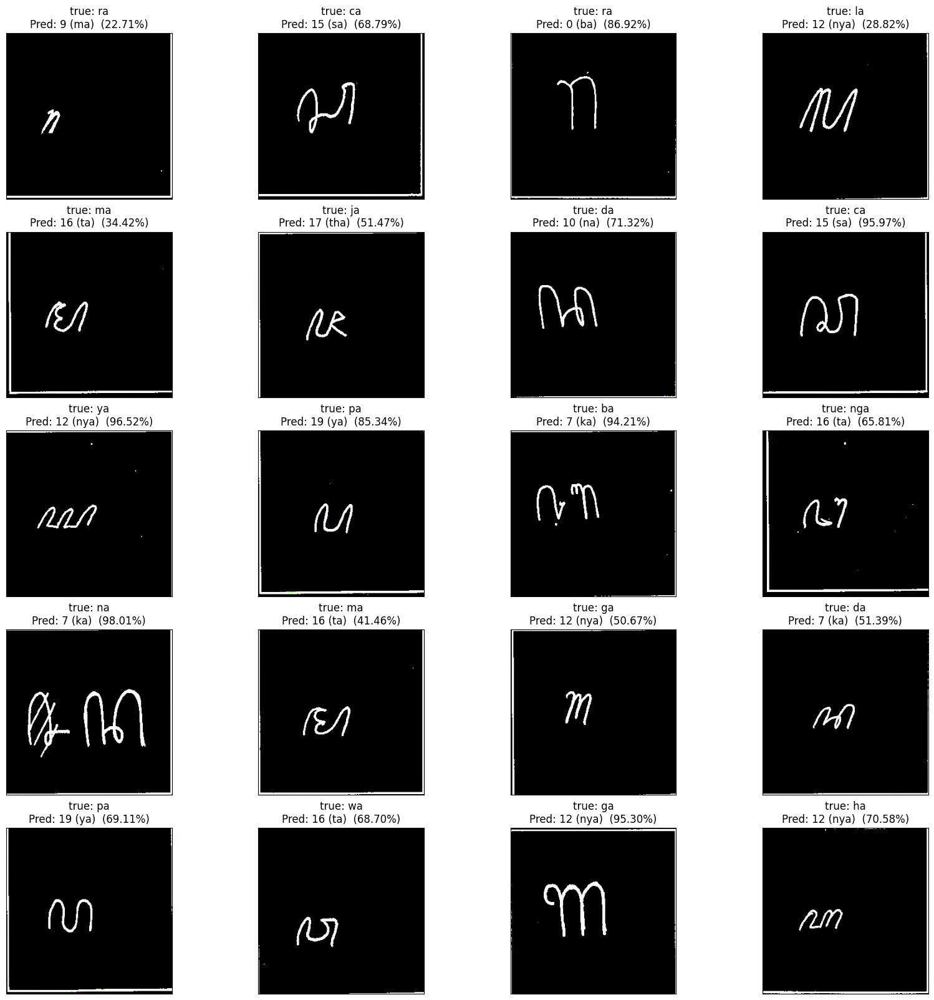

==== END MODEL 29 ====


==== MODEL 30 ====


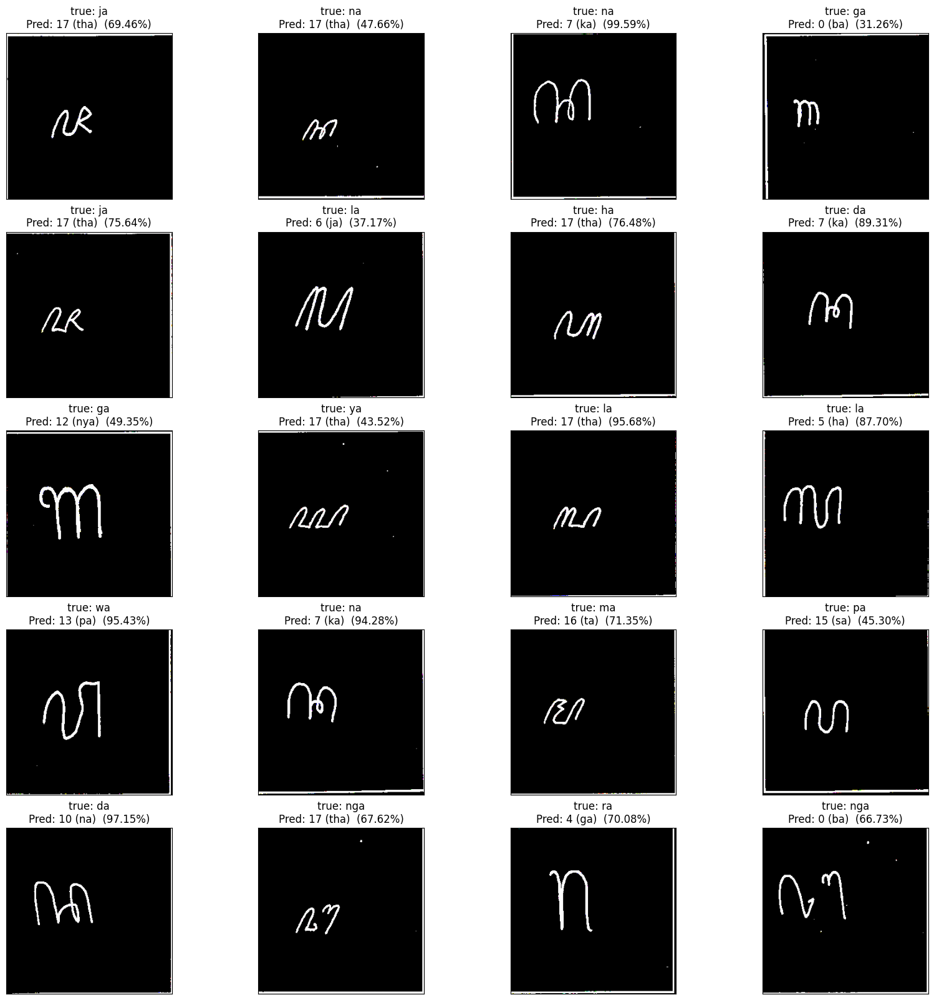

==== END MODEL 30 ====




In [16]:
for id, model in loaded_models.items():
    print(f'==== MODEL {id} ====')
    plot_images(real_test_ds_mapped, model=model, check=True, figsize=(20, 20), verbose=0)
    print(f'==== END MODEL {id} ====\n\n')

# Export Results

In [17]:
results

,model_id,loss,accuracy
0,1,0.536147,0.875
1,2,0.827076,0.860
2,3,0.779805,0.830
3,4,0.961648,0.690
4,5,0.743614,0.830
5,6,0.950159,0.730
6,7,1.789137,0.520
7,8,1.294053,0.695
8,9,1.392980,0.680
9,10,1.480703,0.660


In [20]:
results_sorted = results.sort_values(by=['accuracy'], ascending=[False])
results_sorted

,model_id,loss,accuracy
26,27,0.519716,0.880
20,21,0.596852,0.880
0,1,0.536147,0.875
11,12,0.515577,0.865
1,2,0.827076,0.860
14,15,0.485753,0.840
23,24,0.777513,0.840
2,3,0.779805,0.830
4,5,0.743614,0.830
10,11,0.676074,0.825


In [27]:
results.to_csv('./all_top30_models_result.csv', index=False)

# Showcase

Single testing Model 27 ...
==== MODEL 27 ====


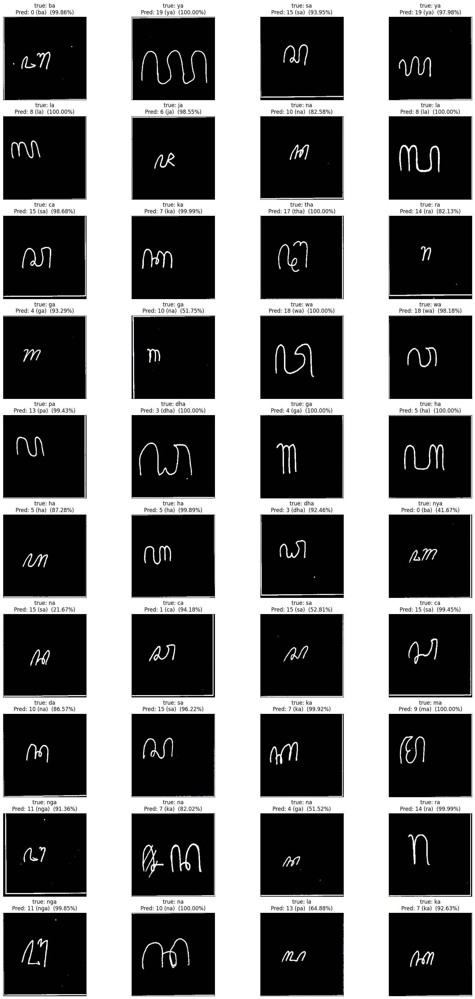

==== END MODEL 27 ====




In [26]:
model_id = 27

print(f'Single testing Model {model_id} ...')
print(f'==== MODEL {model_id} ====')
plot_images(real_test_ds_mapped, n_rows=10, model=loaded_models[model_id], check=False, figsize=(20, 40), verbose=0)
print(f'==== END MODEL {model_id} ====\n\n')

Single testing Model 27 ...
==== MODEL 27 ====


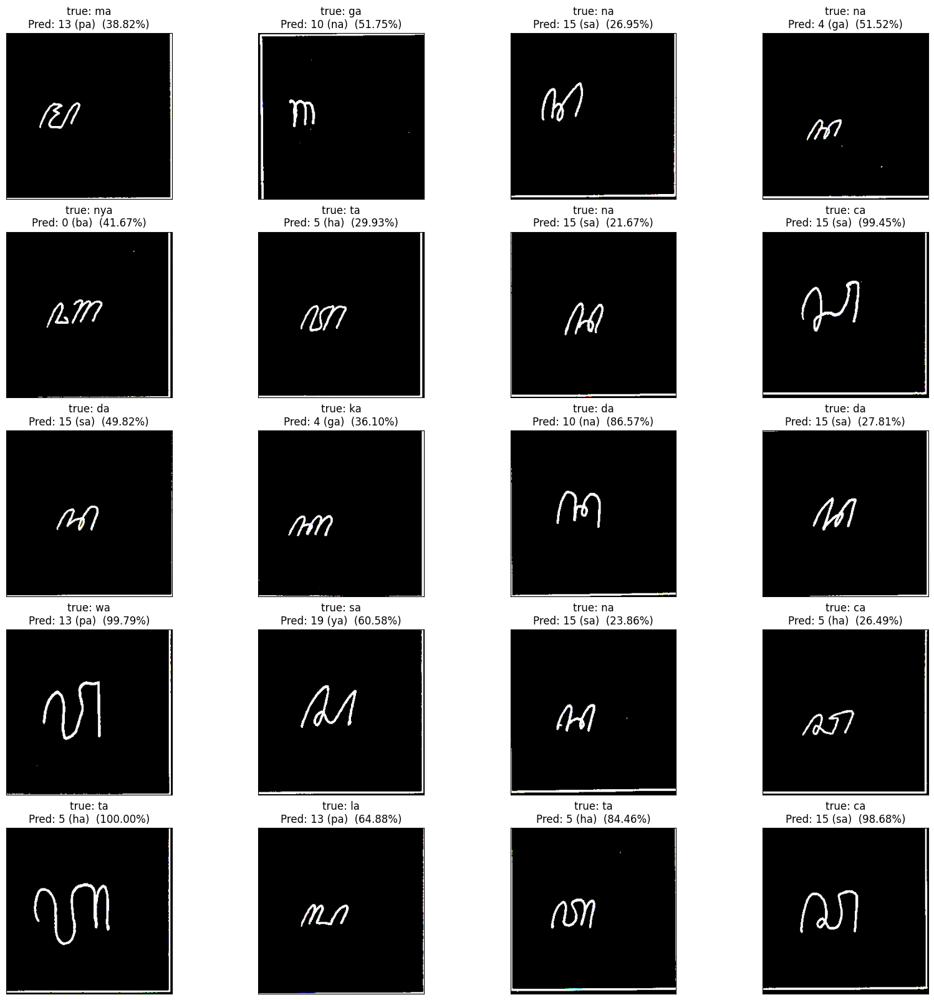

==== END MODEL 27 ====




In [29]:
model_id = 27

print(f'Single testing Model {model_id} ...')
print(f'==== MODEL {model_id} ====')
plot_images(real_test_ds_mapped, model=loaded_models[model_id], check=True, figsize=(20, 20), verbose=0)
print(f'==== END MODEL {model_id} ====\n\n')